# NYC Metro Dataset

Copyright (C) 2022: \
Marcelo Correia | contact: <a>marcelocorreiausp@gmail.com</a>  <br /> 


This program is free software: you can redistribute it and/or modify it under the terms of the GNU General Public License as published by the Free Software Foundation, either version 3 of the License, or (at your option) any later version.

This program is distributed in the hope that it will be useful, but WITHOUT ANY WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE. See the GNU General Public License for more details.

You should have received a copy of the GNU General Public License along with this program. If not, see http://www.gnu.org/licenses/.

<a class="anchor" id="topo"></a>

## Table of Contents

[Part I - Data Analysis and Transform](#part_I)
* [1 Dataset Description](#part_1)
* [2 Exploratory Data Analysis](#part_2)
    * [2.1 Missing Data Imputation, Duplicates and Data Types](#part_3)
    * [2.2 Feature Engineering Part I](#part_4)
    * [2.3 Exploring Data Seasonality](#part_5)
    * [2.4 Feature Engineering Part II](#part_6)
    * [2.5 Exploring Data Frequency](#part_7)
        * [2.5.1 Top 20 Busiest Stations 2010-2017 Total Entries](#part_8)
        * [2.5.2 Top 20 Busiest Stations per Day](#part_9)
        * [2.5.3 Top 20 Busiest Stations per Turnstiles Entries](#part_10)
* [3 Stationarity Test](#part_11)
    * [3.1 59 ST years 2010-2017](#part_12)
    * [3.2 59 ST only year 2017](#part_13)
    * [3.3 34 ST-PENN STA years 2010-2017](#part_14)
    * [3.4 34 ST-PENN STA only year 2017](#part_15)
* [4 Signal Decomposition](#part_16)
    * [4.1 59 ST years 2010-2017](#part_17)
    * [4.2 59 ST only year 2017](#part_18)
    * [4.3 34 ST-PENN STA years 2010-2017](#part_19)
    * [4.4 34 ST-PENN STA only year 2017](#part_20) 
* [5 Autocorrelation Test](#part_21)
    * [5.1 59 ST years 2010-2017](#part_22)
    * [5.2 59 ST only year 2017](#part_23)
    * [5.3 34 ST-PENN STA years 2010-2017](#part_24)
    * [5.4 34 ST-PENN STA only year 2017](#part_25)
* [6 Rolling Mean](#part_26)
* [7 Moving Average](#part_27)
    

[Part II - Prediction Models](#part_II)
* [8 Frequentist Approach - ARIMA Time Series](#part_28)
    * [8.1 59 ST only year 2017](#part_29)
        * [8.1.1 ARIMA 2 and model evaluation](#part_30)
        * [8.1.2 ARIMA 4 and model evaluation](#part_31)
        * [8.1.3 ARIMA 2 and ARIMA 4 Forecasts](#part_32)
    * [8.2 59 ST years 2010-2017](#part_33)
        * [8.2.1 ARIMA 2 and model evaluation](#part_34)
        * [8.2.1 ARIMA 4 and model evaluation](#part_35)
        * [8.2.3 ARIMA 2 and ARIMA 4 Forecasts](#part_36)

* [9 MC3 Time Series](#part_37)
    * [9.1 59 ST year 2017 - Training and Validation Set](#part_38)
    * [9.2 59 ST years 2010-2017 - Training and Validation Set](#part_39)


<hr />

# Final Conclusions (summarized in advance)

## Conclusion: Criterion of anaylisis

### - After exploring data and analyzing grouping by turnstile (ca + unit + scp) and station, using turnstile datetime (every other 4h) smaller granularity, and station granularity by full date (24h grouped), the option to analyze and tackle this problem was made in favor of the following criterion: 
* ### Date and Station (broader granularity)

## Conclusion: Autocorrelation tests

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.
### - There is evidence Autocorrelation levels for both stations, both in weekly and yearly data, is very high, reaching the value of +- 20 autocorrelated days.

## Conclusions: Stationarity and Seasonality tests

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.
### - We can infere there is a very high level of similarity between different stations, with respect to Seasonality. 
### - Sationarity pattern with respect to Trend is clear, unfolding a weekly and yearly based horizontal trend on stations' entries, respectively, observing the charts for each of the studied stations.

## Conclusions: Rolling Mean and Moving Average tests

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.

### - The rolling mean (RM) and the moving average (MA) are not complicated to calculate and, once plotted on a chart, are a powerful visual trend-spotting tool and technical indicator.

### - They indicated a catchable pattern of trend, especially when using small window (RM) and small alpha (MA).


<hr />

# Prediction Models Evaluation - Conclusion
# Experiment Comparison - ARIMA 4, ARIMA 2 and MC3 (Prophet) Time Series models

## The best evaluation so far was reaached by the Bayesian PyMC3 model.

### - Accuracy on Validation Set reached 0.9401 or 94,01% for 1 year predictions dataset,  on a 60-day prediction window within the Validation Set 
### - Accuracy on Validation Set reached 0.9053 or 90,53% for the complete historical data prediction,  on a 1-year prediction window within the Validation Set
### - ARIMA 4,0,2 has beaten ARIMA 2,0,2 reaching 0.8788 or 87,88% for 1 year predictions fitted on Training Set and 0.8645 or 86,45% prediction over the complete historical data.



<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_I"></a>
# Part I


<a class="anchor" id="part_1"></a>
# 1. Dataset Description

You are going to work with the NYC metro database, which has the field description attached below.

The main goal is to forecast the number of people that uses the metro. You can let the imagination work and do this the way you prefer, chosing the temporal/spatial sampling rate (by station/turnstile, day/hour/week etc). This choice is part of the challenge.

Please, do not put everything in a huge ANN model directly, take a nice look at the data and perform a great exploratory data analysis. We prefer to receive the results in a notebook way, but if you wish to provide a nice script, there is no problem =) (If it's nicely commented, of course). 
<br /><br />

**Field Description**

CA,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS

CA = Control Area (A002) UNIT = Remote Unit for a station (R051) SCP = Subunit Channel Position represents an specific address for a device (02-00-00) STATION = Represents the station name the device is located at LINENAME = Represents all train lines that can be boarded at this station Normally lines are represented by one character. LINENAME 456NQR repersents train server for 4, 5, 6, N, Q, and R trains. DIVISION = Represents the Line originally the station belonged to BMT, IRT, or IND
DATE = Represents the date (MM-DD-YY) TIME = Represents the time (hhmmss) for a scheduled audit event DESc = Represent the REGULAR scheduled audit event (Normally occurs every 4 hours) 1. Audits may occur more that 4 hours due to planning, or troubleshooting activities. 2. Additionally, there may be a RECOVR AUD entry This refers to a missed audit that was recovered. ENTRIES = The comulative entry register value for a device EXIST = The cumulative exit register value for a device

Example The data below shows the entryexit register values for one turnstile at control area (A002) from 092714 at 0000 hours to 092914 at 0000 hours

CA,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,000000,REGULAR,0004800073,0001629137, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,040000,REGULAR,0004800125,0001629149, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,080000,REGULAR,0004800146,0001629162, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,120000,REGULAR,0004800264,0001629264, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,160000,REGULAR,0004800523,0001629328, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-27-14,200000,REGULAR,0004800924,0001629371, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,000000,REGULAR,0004801104,0001629395, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,040000,REGULAR,0004801149,0001629402, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,080000,REGULAR,0004801168,0001629414, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,120000,REGULAR,0004801304,0001629463, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,160000,REGULAR,0004801463,0001629521, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-28-14,200000,REGULAR,0004801737,0001629555, A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,09-29-14,000000,REGULAR,0004801836,0001629574,


<hr />

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels as sm
from scipy.stats import norm
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [3]:
from datetime import datetime
import holidays
import calendar

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
plt.rcParams["figure.figsize"] = [23,10]
plt.style.use('seaborn-whitegrid')

[Back to top](#topo).

<hr />

<a class="anchor" id="part_2"></a>
# 2. EDA

In [6]:
# Importing the data with pandas
# Make sure those .csv file are placed alongside this python notebook

df_2010 = pd.read_csv("2010.csv")
df_2011 = pd.read_csv("2011.csv")
df_2012 = pd.read_csv("2012.csv")
df_2013 = pd.read_csv("2013.csv")
df_2014 = pd.read_csv("2014.csv")
df_2015 = pd.read_csv("2015.csv")
df_2016 = pd.read_csv("2016.csv")
df_2017 = pd.read_csv("2017.csv")

In [7]:
df = pd.concat([df_2010, df_2011, df_2012, df_2013, df_2014, df_2015, df_2016, df_2017], axis=0)

In [8]:
df.shape

(79609191, 10)

In [11]:
df_2017.shape

(7466025, 10)

In [499]:
df.head()

,time,ca,unit,scp,station,linename,division,desc,entries,exits,turnstile,date,hour,day,month,year,weekday
0,2010-04-17 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704717.0,928793.0,A002 R051 02-00-00,2010-04-17,04,17,4,2010,Saturday
1,2010-04-17 04:00:00,A002,R051,02-00-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2697632.0,566683.0,A002 R051 02-00-01,2010-04-17,04,17,4,2010,Saturday
2,2010-04-17 04:00:00,A002,R051,02-03-00,LEXINGTON AVE,456NQR,BMT,REGULAR,1127722.0,3943492.0,A002 R051 02-03-00,2010-04-17,04,17,4,2010,Saturday
3,2010-04-17 04:00:00,A002,R051,02-03-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2425570.0,3733289.0,A002 R051 02-03-01,2010-04-17,04,17,4,2010,Saturday
4,2010-04-17 04:00:00,A002,R051,02-03-02,LEXINGTON AVE,456NQR,BMT,REGULAR,2214633.0,3021589.0,A002 R051 02-03-02,2010-04-17,04,17,4,2010,Saturday


[Back to top](#topo).

<hr />

<a class="anchor" id="part_3"></a>
# 2.1 Missing Data Imputation, Duplicates and Data Types

In [988]:
# Checking the new data types assigned

df.dtypes

time                 object
ca                   object
unit                 object
scp                  object
station              object
linename             object
division             object
desc                 object
entries             float64
exits               float64
turnstile            object
date         datetime64[ns]
hour                 object
day                   int64
month                 int64
year                  int64
weekday              object
dtype: object

In [9]:
# Drop Dups

df.drop_duplicates(subset=['ca', 'unit', 'scp', 'station', 'time', ], keep = 'first',  inplace=True)

In [10]:
# Drop missing values

df.dropna(axis=0, inplace=True)

In [14]:
df.columns

Index(['time', 'ca', 'unit', 'scp', 'station', 'linename', 'division', 'desc',
       'entries', 'exits'],
      dtype='object')

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77259696 entries, 0 to 7466024
Data columns (total 10 columns):
 #   Column    Dtype  
---  ------    -----  
 0   time      object 
 1   ca        object 
 2   unit      object 
 3   scp       object 
 4   station   object 
 5   linename  object 
 6   division  object 
 7   desc      object 
 8   entries   float64
 9   exits     float64
dtypes: float64(2), object(8)
memory usage: 6.3+ GB


<hr />

In [19]:
# Frequency of instances by category - number of stations/turnstiles along time (2010-2017)

df['station'].value_counts()

34 ST-PENN STA     1701354
WALL ST            1572360
FULTON ST          1191153
34 ST-HERALD SQ     979204
CANAL ST            971980
86 ST               893375
CHAMBERS ST         866426
23 ST               857649
42 ST-GRD CNTRL     817124
125 ST              757216
59 ST               716453
42 ST-PA BUS TE     675284
14 ST-UNION SQ      663351
JAY ST-METROTEC     657501
42 ST-TIMES SQ      647196
59 ST-COLUMBUS      644894
50 ST               608339
METS-WILLETS PT     596134
96 ST               569929
47-50 ST-ROCK       553158
28 ST               508822
BOWLING GREEN       495365
14 ST               493865
CHURCH AVE          483066
161 ST-YANKEE       473172
COURT SQ            449621
QUEENS PLAZA        433761
72 ST               429925
LEXINGTON-53 ST     419516
5 AVE-53 ST         415455
ST. GEORGE          414574
EXCHANGE PLACE      405617
66 ST-LINCOLN       389727
135 ST              385703
51 ST               384633
33 ST               372274
KINGS HIGHWAY       371939
1

In [892]:
# Number of stations

df['station'].nunique()

# There are 574 unique categories of stations within our database

574

In [77]:
stations = df_daily.groupby(['station'])
stations['station'].count()

station
1 AV                 6370
1 AVE               20645
103 ST              40250
103 ST-CORONA       24219
104 ST              13965
110 ST              16134
110 ST-CATHEDRL     14378
110 ST-CPN          11079
111 ST              28555
116 ST              59170
116 ST-COLUMBIA     16110
121 ST              13551
125 ST             115787
135 ST              61866
137 ST CITY COL      6325
137 ST-CITY COL     20418
138 ST-3 AVE         8176
138 ST-GR CONC       6149
138/GRAND CONC       1911
14 ST               78756
14 ST-6 AVE         36910
14 ST-UNION SQ     102087
145 ST              51104
148 ST-LENOX         6141
149 ST-3 AVE        30473
149 ST-GR CONC      14292
149/GRAND CONC       4444
14TH STREET         29289
15 ST-PROSPECT      27420
155 ST              21605
157 ST              21452
161 ST-YANKEE       75660
161/YANKEE STAD     23569
163 ST-AMSTERDM     16179
167 ST              32199
168 ST              12739
168 ST-BROADWAY     36912
169 ST              40265
170 

In [ ]:
# Number of instances by station along time (2010-2017) 

plt.figure(figsize=(90,15))
subgrade_order = df['station'].dropna(axis=0).unique()
sns.countplot(x='station', data=df, order = subgrade_order, palette='coolwarm')
plt.ylabel('number of instances')
plt.xticks(rotation=90);

In [13]:
station_instances = df['station'].value_counts()
station_instances.to_csv('station_instances.csv')
instances = pd.read_csv('station_instances.csv', names=['station', 'count'], header=0)

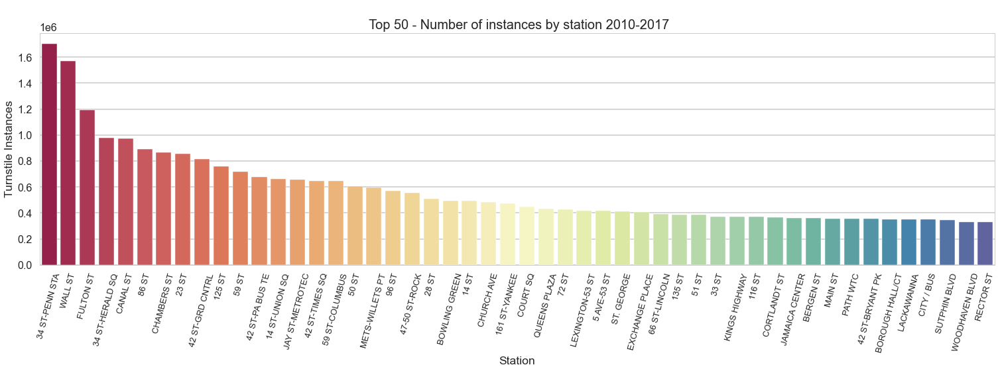

In [339]:
# Number of instances, by station, along time (2010-2017) - Top 50
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=(23,6), dpi=72) 

sns.barplot(x='station', y='count', data=instances[0:50], palette='Spectral', saturation=0.75).set_title('\n Top 50 - Number of instances by station 2010-2017', size = 20)
ax.set(xlabel='Station', ylabel='Turnstile Instances')
plt.xticks(rotation=75, size=13);

### These are the top 50 stations with respect to number of turnstile devices instances measured over time, within our database. #1 is 34 ST-PENN STATION.

[Back to top](#topo).

<hr />

<a class="anchor" id="part_4"></a>
# 2.2 Feature Engineering Part I

In [11]:
# Creating a Unique Device Identifier - "Turnstile" ("catraca")

df['turnstile'] = df['ca'] + ' ' + df['unit'] + ' ' + df['scp'] #+ ' ' + df['station']


In [13]:
df['date'] =  pd.to_datetime(df['time']).dt.date

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77259696 entries, 0 to 7466024
Data columns (total 12 columns):
 #   Column     Dtype  
---  ------     -----  
 0   time       object 
 1   ca         object 
 2   unit       object 
 3   scp        object 
 4   station    object 
 5   linename   object 
 6   division   object 
 7   desc       object 
 8   entries    float64
 9   exits      float64
 10  turnstile  object 
 11  date       object 
dtypes: float64(2), object(10)
memory usage: 7.5+ GB


In [11]:
df['hour'] = df['time'].apply(lambda x : x.split()[1].split(":")[0])
df['day'] = df['date'].apply(lambda x: x.day )
df['month'] = df['date'].apply(lambda x: x.month )
df['year'] = df['date'].apply(lambda x: x.year )


In [12]:
#df["weekday"] =  df['date'].apply(lambda dateString : calendar.day_name[datetime.strptime(dateString,"%Y-%m-%d").weekday()])
df['date'] = pd.to_datetime(df['date'])
df["weekday"]  = df['date'].dt.day_name()

In [24]:
df.columns

Index(['time', 'ca', 'unit', 'scp', 'station', 'linename', 'division', 'desc',
       'entries', 'exits', 'turnstile', 'date', 'hour', 'day', 'month', 'year',
       'weekday'],
      dtype='object')

In [832]:
df.head()

,time,ca,unit,scp,station,linename,division,desc,entries,exits,turnstile,date,hour,day,month,year,weekday
0,2010-04-17 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704717.0,928793.0,A002 R051 02-00-00,2010-04-17,04,17,4,2010,Saturday
1,2010-04-17 04:00:00,A002,R051,02-00-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2697632.0,566683.0,A002 R051 02-00-01,2010-04-17,04,17,4,2010,Saturday
2,2010-04-17 04:00:00,A002,R051,02-03-00,LEXINGTON AVE,456NQR,BMT,REGULAR,1127722.0,3943492.0,A002 R051 02-03-00,2010-04-17,04,17,4,2010,Saturday
3,2010-04-17 04:00:00,A002,R051,02-03-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2425570.0,3733289.0,A002 R051 02-03-01,2010-04-17,04,17,4,2010,Saturday
4,2010-04-17 04:00:00,A002,R051,02-03-02,LEXINGTON AVE,456NQR,BMT,REGULAR,2214633.0,3021589.0,A002 R051 02-03-02,2010-04-17,04,17,4,2010,Saturday


[Back to top](#topo).

<hr />

<a class="anchor" id="part_5"></a>
# 2.3 Exploring Data Seasonality

In [ ]:
# Creating a dataset grouping the new time-based variables, summarizing the entries to the stations only

df_daily = (df.groupby(['turnstile', 'station', 'date', 'hour', 'day', 'month', 'year', 'weekday'], as_index=False).entries.first())

#### We observe a decreasing in entries from September. But always remember we have the year 2017 from January through September 23 only. 

C:\Users\marce\AppData\Local\Temp/ipykernel_4660/2971373086.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(daysweek)


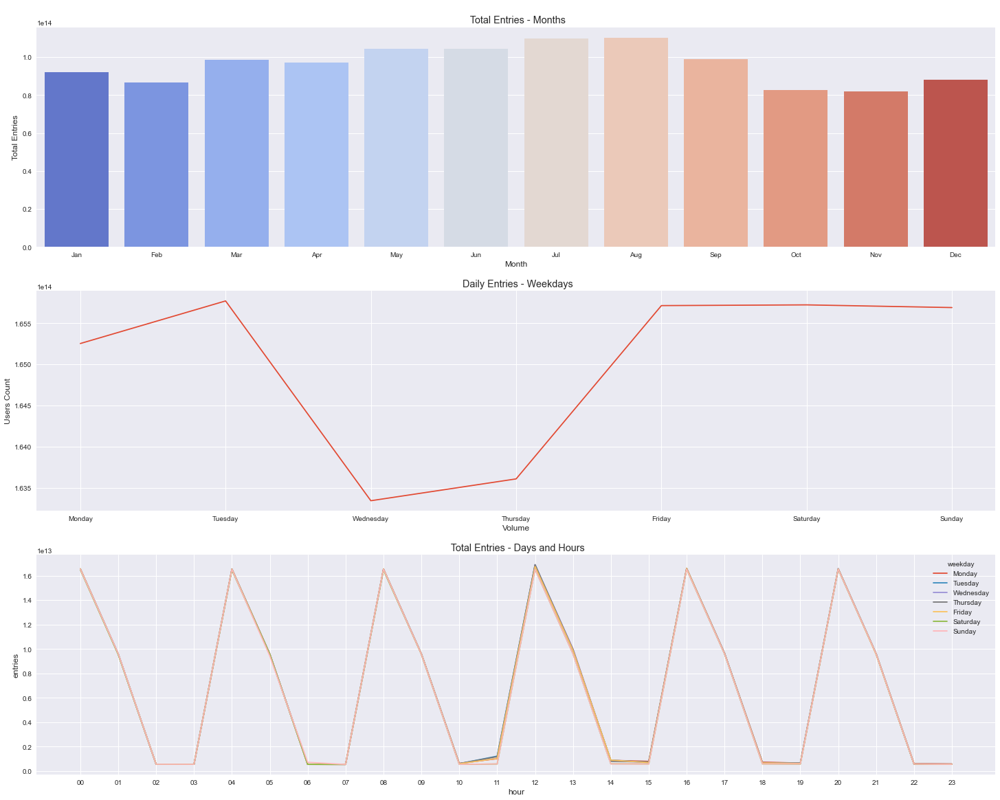

In [1182]:
plt.style.use('seaborn-darkgrid')
fig, (ax1,ax2,ax3)= plt.subplots(figsize=(15, 10), nrows=3)
fig.set_size_inches(20, 10)

weekdays = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']


# monthAggregated = pd.DataFrame(df_daily.groupby("month").agg({'entries':sum})).reset_index()
# sns.pointplot(data=monthAggregated, x="month",y="entries", ax=ax1, color='b')
# ax1.set(xlabel='Month', ylabel='Daily Entries',title="\n Daily Entries - Months")

monthAggregated = pd.DataFrame(df_daily.groupby("month").agg({'entries':sum})).reset_index()
sns.barplot(data=monthAggregated, x="month",y="entries", ax=ax1, palette='coolwarm')
ax1.set_xticklabels(months)
ax1.set(xlabel='Month', ylabel='Total Entries', title="\n Total Entries - Months")

hourAggregated = pd.DataFrame(df_daily.groupby("weekday").agg({'entries':sum})).reset_index()
sns.lineplot(x="weekday", y="entries", data=hourAggregated, markers=True, ax=ax2)
ax2.set_xticklabels(weekdays)
ax2.set(xlabel='Volume', ylabel='Users Count',title="\n Daily Entries - Weekdays",label='big')

weekAggregated = pd.DataFrame(df_daily.groupby(["weekday", "hour"]).agg({'entries':sum})).reset_index()
sns.lineplot(data=weekAggregated, x="hour", y="entries", hue="weekday", palette=sns.color_palette(n_colors=7), ax=ax3, hue_order=weekdays)
ax3.set(title="\n Total Entries - Days and Hours");


<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_6"></a>
# 2.4 Feature Engineering Part II

**From this point, we will work with the time-based dates varibale only**

In [14]:
# New dataset configuration

df_daily = (df.groupby(['turnstile', 'station', 'date'], as_index=False).entries.first())

In [15]:
df_daily[["PREV_DATE", "PREV_ENTRIES"]] = (df_daily.groupby(['turnstile', 'station'])["date","entries"].apply(lambda grp: grp.shift(1)))

# Dropping top row of NaN's
df_daily.dropna(subset=["PREV_DATE"], axis=0, inplace=True)

C:\Users\marce\AppData\Local\Temp/ipykernel_19296/3030187063.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_daily[["PREV_DATE", "PREV_ENTRIES"]] = (df_daily.groupby(['turnstile', 'station'])["date","entries"].apply(lambda grp: grp.shift(1)))


In [16]:
# counter

def get_daily_counts(row, max_counter):
    counter = row["entries"] - row["PREV_ENTRIES"]
    if counter < 0:
        counter = -counter
    if counter > max_counter:
        counter = min(row["entries"], row["PREV_ENTRIES"])
    if counter > max_counter:
        return 0
    return counter

In [17]:
# Adding DAILY ENTRIES column

df_daily["DAILY_ENTRIES"] = df_daily.apply(get_daily_counts, axis=1, max_counter=40000)

In [18]:
# Dropping top row of NaN's

df_daily.dropna(subset=["PREV_DATE"], axis=0, inplace=True)

In [87]:
df_daily.head(10)

,turnstile,station,date,entries,PREV_DATE,PREV_ENTRIES,DAILY_ENTRIES
1,A002 R051 02-00-00,59 ST,2015-12-27,5470180.0,2015-12-26,5469540.0,640.0
2,A002 R051 02-00-00,59 ST,2015-12-28,5470922.0,2015-12-27,5470180.0,742.0
3,A002 R051 02-00-00,59 ST,2015-12-29,5472356.0,2015-12-28,5470922.0,1434.0
4,A002 R051 02-00-00,59 ST,2015-12-30,5473915.0,2015-12-29,5472356.0,1559.0
5,A002 R051 02-00-00,59 ST,2015-12-31,5475662.0,2015-12-30,5473915.0,1747.0
6,A002 R051 02-00-00,59 ST,2016-01-01,5477257.0,2015-12-31,5475662.0,1595.0
7,A002 R051 02-00-00,59 ST,2016-01-02,5477962.0,2016-01-01,5477257.0,705.0
8,A002 R051 02-00-00,59 ST,2016-01-03,5478940.0,2016-01-02,5477962.0,978.0
9,A002 R051 02-00-00,59 ST,2016-01-04,5479861.0,2016-01-03,5478940.0,921.0
10,A002 R051 02-00-00,59 ST,2016-01-05,5481461.0,2016-01-04,5479861.0,1600.0


[Back to top](#topo).

<hr />

<a class="anchor" id="part_7"></a>
# 2.5 Exploring Data Frequency

<hr />

In [23]:
df_daily = df_daily[['turnstile', 'station', 'date', 'entries', 'PREV_DATE', 'PREV_ENTRIES', 'DAILY_ENTRIES' ]]
df_daily.head()

,turnstile,station,date,entries,PREV_DATE,PREV_ENTRIES,DAILY_ENTRIES
1,A002 R051 02-00-00,59 ST,2015-12-27,5470180.0,2015-12-26,5469540.0,640.0
2,A002 R051 02-00-00,59 ST,2015-12-28,5470922.0,2015-12-27,5470180.0,742.0
3,A002 R051 02-00-00,59 ST,2015-12-29,5472356.0,2015-12-28,5470922.0,1434.0
4,A002 R051 02-00-00,59 ST,2015-12-30,5473915.0,2015-12-29,5472356.0,1559.0
5,A002 R051 02-00-00,59 ST,2015-12-31,5475662.0,2015-12-30,5473915.0,1747.0


<a class="anchor" id="part_8"></a>
## 2.5.1 Top 20 Busiest Stations 2010-2017 Total Entries

In [88]:
df_daily = df_daily[[ 'station', 'date', 'DAILY_ENTRIES' ]]
df_daily.head(10)

,station,date,DAILY_ENTRIES
1,59 ST,2015-12-27,640.0
2,59 ST,2015-12-28,742.0
3,59 ST,2015-12-29,1434.0
4,59 ST,2015-12-30,1559.0
5,59 ST,2015-12-31,1747.0
6,59 ST,2016-01-01,1595.0
7,59 ST,2016-01-02,705.0
8,59 ST,2016-01-03,978.0
9,59 ST,2016-01-04,921.0
10,59 ST,2016-01-05,1600.0


In [90]:
df_daily.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11985729 entries, 1 to 11993028
Data columns (total 3 columns):
 #   Column         Dtype  
---  ------         -----  
 0   station        object 
 1   date           object 
 2   DAILY_ENTRIES  float64
dtypes: float64(1), object(2)
memory usage: 365.8+ MB


In [302]:
top20_stations = \
    (df_daily.groupby(['station'])['DAILY_ENTRIES'].sum()
                   .reset_index()
                   .sort_values(by='DAILY_ENTRIES',ascending=False) 
                   .head(20))

In [303]:
top20_stations

,station,DAILY_ENTRIES
86,34 ST-PENN STA,397214897.0
21,14 ST-UNION SQ,261175399.0
95,42 ST-GRD CNTRL,253357707.0
160,86 ST,250244025.0
64,23 ST,185924423.0
96,42 ST-PA BUS TE,179158126.0
259,CANAL ST,172821703.0
12,125 ST,165753539.0
123,59 ST,156473882.0
167,96 ST,155576028.0


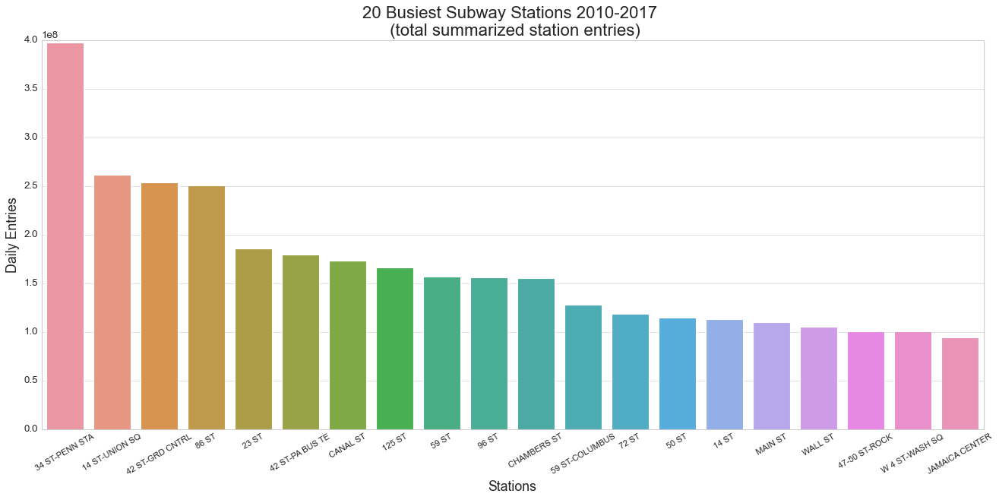

In [866]:
plt.figure(figsize=(20,8))
ax = sns.barplot(x='station',y='DAILY_ENTRIES',data=top20_stations)
ax.set_title('20 Busiest Subway Stations 2010-2017 \n (total summarized station entries)', size = 20)
ax.set_xlabel('Stations', size = 16)
ax.set_ylabel('Daily Entries', size = 16)
plt.xticks(rotation=30, size=10);

<hr />

<a class="anchor" id="part_9"></a>
## 2.5.2 Top 20 Busiest Stations per Day

In [882]:
top20_stations = \
    (df_daily.groupby(['station', 'date']).sum('DAILY_ENTRIES')
                   .reset_index()
                   .sort_values(by='DAILY_ENTRIES',ascending=False) 
                   .station.head(40).unique())

In [883]:
top20_stations

array(['34 ST-PENN STA', '42 ST-GRD CNTRL', '34 ST-HERALD SQ', '86 ST',
       '14 ST-UNION SQ', '42 ST-TIMES SQ', '125 ST', '42 ST-PA BUS TE',
       '23 ST', 'WALL ST', 'CANAL ST', '42 ST-BRYANT PK', '96 ST',
       '59 ST', '47-50 ST-ROCK', 'CHAMBERS ST', '28 ST', 'PATH WTC',
       'BARCLAYS CENTER', '59 ST-COLUMBUS'], dtype=object)

In [884]:
station_daily_top20 = \
    df_daily[df_daily['station'].isin(top20_stations)].sort_values(by = 'DAILY_ENTRIES', ascending = False)

In [885]:
df_station_daily_top20 = station_daily_top20.groupby(['station', 'date']).sum('DAILY_ENTRIES')

In [75]:
df_station_daily_top20.head()

DAILY_ENTRIES
station date                     
125 ST  2010-04-18        43887.0
        2010-04-19        43584.0
        2010-04-20        75000.0
        2010-04-21        77945.0
        2010-04-22        78194.0

In [886]:
df_station_daily_top20.to_csv('stations_dates_daily.csv')
df_station_daily_top20 = pd.read_csv('stations_dates_daily.csv')

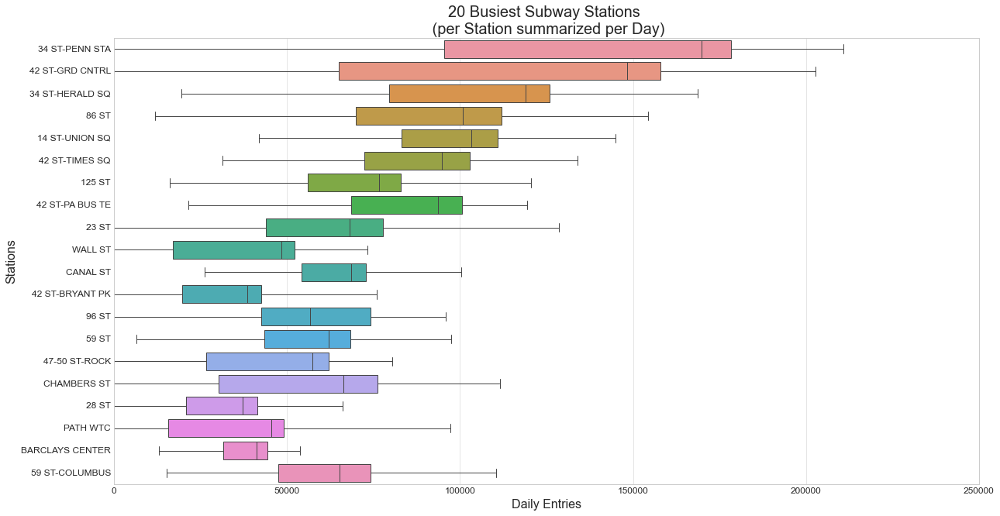

In [887]:
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=(20,10), dpi=72) 

ax = sns.boxplot(x='DAILY_ENTRIES', y='station', data=df_station_daily_top20, order = top20_stations, \
            showfliers = False)

ax.set_title('20 Busiest Subway Stations \n (per Station summarized per Day)', size = 20)
ax.set_xlabel('Daily Entries', size = 16)
ax.set_ylabel('Stations', size = 16);

<hr />

<a class="anchor" id="part_10"></a>
## 2.5.3 Top 20 Busiest Stations per Turnstiles Entries

In [20]:
top20_stations = \
    (df_daily.groupby(['station'])['DAILY_ENTRIES'].sum()
                   .reset_index()
                   .sort_values(by='DAILY_ENTRIES',ascending=False) 
                   .station.head(20))

In [21]:
station_daily_top20 = \
    df_daily[df_daily['station'].isin(top20_stations)].sort_values(by = 'DAILY_ENTRIES', ascending = False)

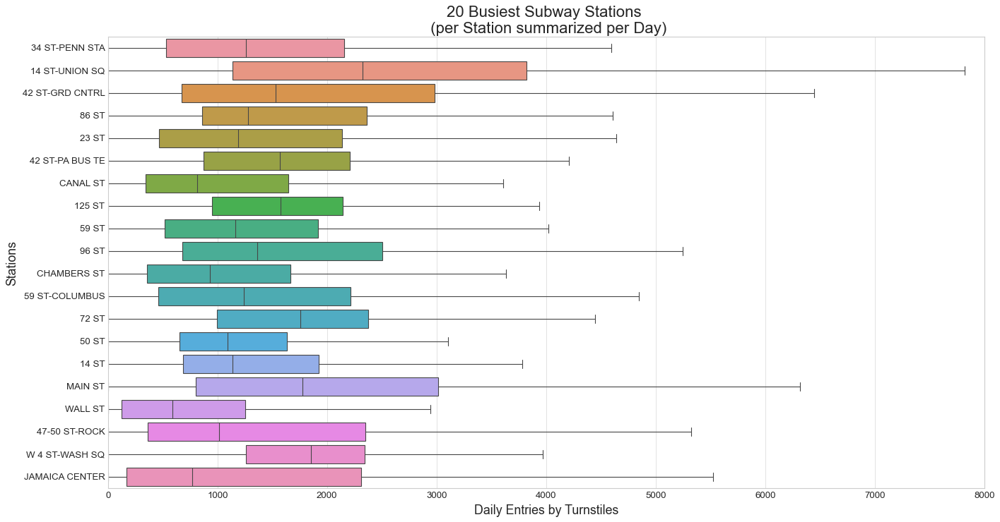

In [881]:
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=(20,10)) 

ax = sns.boxplot(x='DAILY_ENTRIES', y='station', data=station_daily_top20, order = top20_stations, \
            showfliers = False)

ax.set_title('20 Busiest Subway Stations \n (per Station summarized per Day/Turnstile)', size = 20)
ax.set_xlabel('Daily Entries by Turnstiles', size = 16)
ax.set_ylabel('Stations', size = 16);

<hr />

# Conclusion: Criterion of anaylisis

After exploring data and analyzing grouping by turnstile (ca + unit + scp) and station, using turnstile datetime (every other 4h) smaller granularity, and station granularity by full date (24h grouped), the option to analyze and tackle this problem was made in favor of the following criterion: 
* **Date and Station (broader granularity)**

<hr />

[Back to top](#topo).

<a class="anchor" id="part_11"></a>
# 3. Stationarity Test

<hr />

<a class="anchor" id="part_12"></a>
## 3.1 59 ST years 2010-2017

In [77]:
# Creating the station '59 ST' dataframe

df_59 = df_daily[df_daily['station']=='59 ST']

In [78]:
df_59 = df_59[['date', 'DAILY_ENTRIES']]

In [79]:
df_59_date = df_59.groupby('date').sum('DAILY_ENTRIES')

In [ ]:
df_59_date.reset_index(inplace=True)

### Detect and Remove the Outliers

In [81]:
''' Detecting the Outliers '''

# IQR
Q1 = np.percentile(df_59_date['DAILY_ENTRIES'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df_59_date['DAILY_ENTRIES'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
 
print("Old Shape: ", df_59_date.shape)



# Upper bound
upper = np.where(df_59_date['DAILY_ENTRIES'] >= (Q3 + 1.5*IQR))
# Lower bound
lower = np.where(df_59_date['DAILY_ENTRIES'] <= (Q1 - 1.5*IQR))


Old Shape:  (2704, 2)


In [83]:
''' Removing the Outliers '''

df_59_date.drop(upper[0], inplace = True)
df_59_date.drop(lower[0], inplace = True)

print("New Shape: ", df_59_date.shape)

New Shape:  (2693, 2)


### Stationarity Test

In [99]:
# Test for Stationarity
def stationarity_test(timeseries):
    """"Augmented Dickey-Fuller Test
    Test for Stationarity"""
    from statsmodels.tsa.stattools import adfuller
    print("Results of Dickey-Fuller Test:")
    df_test = adfuller(timeseries, autolag = "AIC")
    df_output = pd.Series(df_test[0:4],
                          index = ["Test Statistic", "p-value", "#Lags Used",
                                   "Number of Observations Used"])
    print(df_output)

In [104]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_59_ts = pd.Series(df_59_date['DAILY_ENTRIES'].values,
                         index = pd.date_range('2010-04-18',
                                               periods = 2693,
                                               freq = 'D'))


In [101]:
# Test application on the NYC Metro '59 ST' station 2017 dataset

stationarity_test(df_59_ts)

Results of Dickey-Fuller Test:
Test Statistic                   -3.784121
p-value                           0.003074
#Lags Used                       28.000000
Number of Observations Used    2664.000000
dtype: float64


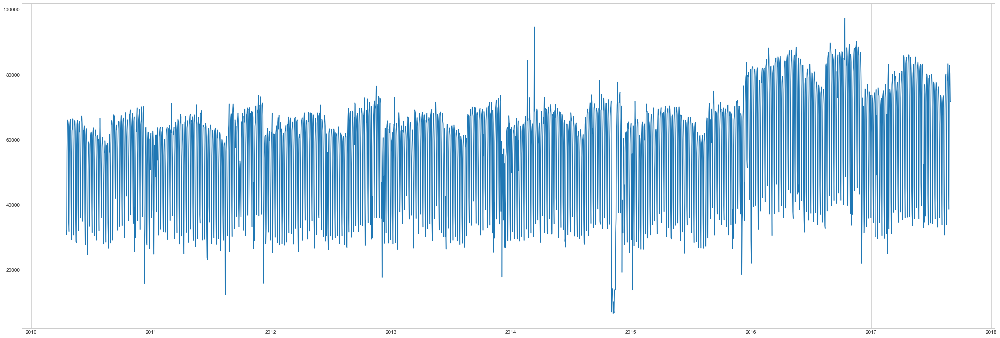

In [106]:
# 2017 '59 ST' station data
# Note the characteristics of stationary data on the plot

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(35,12))
plt.plot(df_59_ts);



### Conclusion: noticeable Yearly stationarity

<hr />

<a class="anchor" id="part_13"></a>
## 3.2 59 ST only year 2017

In [251]:
# Test for Stationarity
def stationarity_test(timeseries):
    """"Augmented Dickey-Fuller Test
    Test for Stationarity"""
    from statsmodels.tsa.stattools import adfuller
    print("Results of Dickey-Fuller Test:")
    df_test = adfuller(timeseries, autolag = "AIC")
    df_output = pd.Series(df_test[0:4],
                          index = ["Test Statistic", "p-value", "#Lags Used",
                                   "Number of Observations Used"])
    print(df_output)

In [252]:
df_59.dtypes

date              object
DAILY_ENTRIES    float64
dtype: object

In [253]:
df_59['date'] = pd.to_datetime(df_59['date'])

In [254]:
df_59_2017 = df_59[df_59['date'] >= '2017-01-01']

In [255]:
df_59_2017_date = df_59_2017.groupby('date').sum('DAILY_ENTRIES')

In [256]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_59_2017ts = pd.Series(df_59_2017_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2017-01-01',
                                           periods = 266,
                                           freq = 'D'))


In [257]:
# Test application on the NYC Metro '59 ST' station 2017 dataset

stationarity_test(df_59_2017ts)

Results of Dickey-Fuller Test:
Test Statistic                  -2.478271
p-value                          0.120851
#Lags Used                      14.000000
Number of Observations Used    251.000000
dtype: float64


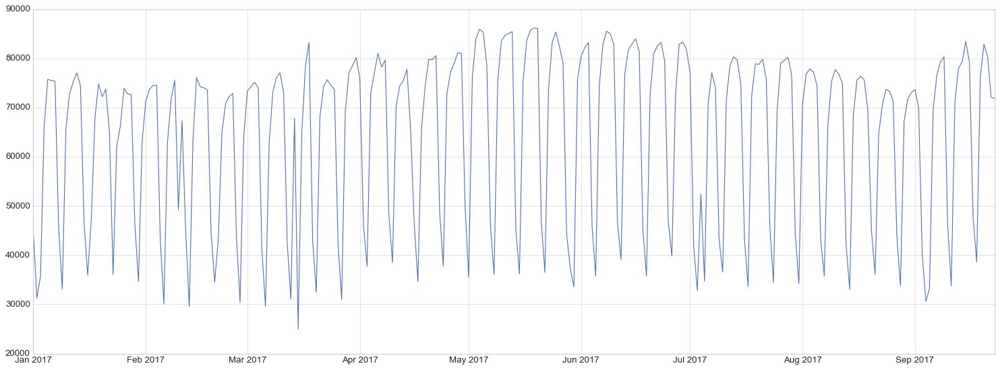

In [521]:
# 2017 '59 ST' station data
# Note the characteristics of stationary data on the plot

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(23,8))
plt.plot(df_59_2017ts);



### Conclusion: noticeable Weekly stationarity

<hr />

<hr />

<a class="anchor" id="part_14"></a>
## 3.3 34 ST-PENN STA years 2010-2017

In [174]:
# Creating the station '34 ST-PENN STA' dataframe

df_34 = df_daily[df_daily['station']=='34 ST-PENN STA']

In [175]:
df_34 = df_34[['date', 'DAILY_ENTRIES']]

In [176]:
df_34_date = df_34.groupby('date').sum('DAILY_ENTRIES')

In [177]:
df_34_date.reset_index(inplace=True)
df_34_date

,date,DAILY_ENTRIES
0,2010-04-18,72727.0
1,2010-04-19,71734.0
2,2010-04-20,160138.0
3,2010-04-21,165974.0
4,2010-04-22,170284.0
5,2010-04-23,169784.0
6,2010-04-24,168570.0
7,2010-05-01,1000230.0
8,2010-05-02,69987.0
9,2010-05-03,68897.0


### Detect and Remove the Outliers

In [178]:
''' Detecting the Outliers '''

# IQR
Q1 = np.percentile(df_34_date['DAILY_ENTRIES'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df_34_date['DAILY_ENTRIES'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
 
print("Old Shape: ", df_34_date.shape)



# Upper bound
upper = np.where(df_34_date['DAILY_ENTRIES'] >= (Q3 + 0.5*IQR)) # Threshold corrected from 1.5 to 0.5
# Lower bound
lower = np.where(df_34_date['DAILY_ENTRIES'] <= (Q1 - 0.5*IQR)) # Threshold corrected from 1.5 to 0.5


Old Shape:  (2704, 2)


In [179]:
''' Removing the Outliers '''

df_34_date.drop(upper[0], inplace = True)
df_34_date.drop(lower[0], inplace = True)

print("New Shape: ", df_34_date.shape)

New Shape:  (2675, 2)


### Stationarity Test

In [180]:
# Test for Stationarity
def stationarity_test(timeseries):
    """"Augmented Dickey-Fuller Test
    Test for Stationarity"""
    from statsmodels.tsa.stattools import adfuller
    print("Results of Dickey-Fuller Test:")
    df_test = adfuller(timeseries, autolag = "AIC")
    df_output = pd.Series(df_test[0:4],
                          index = ["Test Statistic", "p-value", "#Lags Used",
                                   "Number of Observations Used"])
    print(df_output)

In [184]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_34_ts = pd.Series(df_34_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2010-04-18',
                                           periods = 2675,
                                           freq = 'D'))


In [185]:
# Test application on the NYC Metro '34 ST-PENN STA' 2010-2017 dataset

stationarity_test(df_34_ts)

Results of Dickey-Fuller Test:
Test Statistic                -6.758432e+00
p-value                        2.832432e-09
#Lags Used                     2.800000e+01
Number of Observations Used    2.646000e+03
dtype: float64


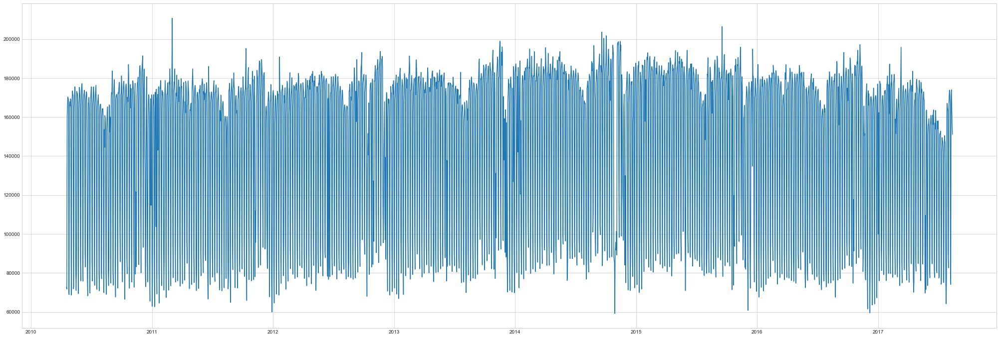

In [186]:
# 2017 '59 ST' station data
# Note the characteristics of stationary data on the plot

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(35,12))
plt.plot(df_34_ts);



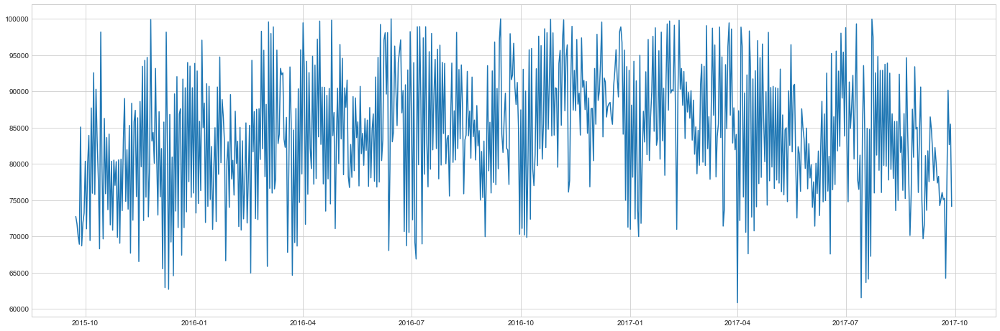

In [189]:
# 2010-2017 '34 ST-PENN STA' data
# Note the characteristics of stationary data on the plot

df_34_date2 = df_34_date[(df_34_date['DAILY_ENTRIES']< 100000) & (df_34_date['DAILY_ENTRIES']> 60000)]
df_34_ts2 = pd.Series(df_34_date2['DAILY_ENTRIES'].values,
                     index = pd.date_range('2015-09-23',
                                           periods = 737,
                                           freq = 'D'))

plt.style.use('seaborn-whitegrid')


plt.figure(figsize=(24,8))
plt.plot(df_34_ts2);



### Conclusion: noticeable Weekly stationarity

<hr />

<a class="anchor" id="part_15"></a>
## 3.4    34 ST-PENN STA only year 2017

In [116]:
df_34['date'] = pd.to_datetime(df_34['date'])

In [117]:
df_34_2017 = df_34[df_34['date']>= '2017-01-01']

In [118]:
df_34_2017_date = df_34_2017.groupby('date').sum('DAILY_ENTRIES')

<AxesSubplot:xlabel='date', ylabel='DAILY_ENTRIES'>

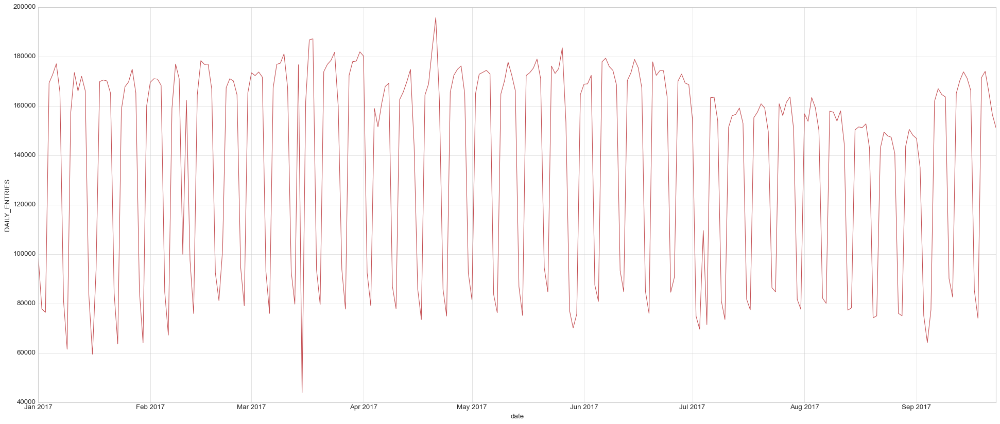

In [890]:
plt.style.use('seaborn-whitegrid')

fig, ax = plt.subplots(figsize=(30,12)) 

sns.lineplot(x='date', y='DAILY_ENTRIES',data=df_34_2017_date, color='r')


### Conclusion: noticeable Yearly stationarity

<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_16"></a>
# 4. Signal Decomposition

<a class="anchor" id="part_17"></a>
## 4.1 59 ST years 2010-2017

In [200]:
# Seasonal Decomposition
# Simple seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

In [194]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_59_ts = pd.Series(df_59_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2010-04-18',
                                           periods = 2693,
                                           freq = 'D'))


In [201]:
decomposed = seasonal_decompose(df_59_ts)

In [202]:
decomposed.trend, decomposed.seasonal, decomposed.resid

(2010-04-18             NaN
 2010-04-19             NaN
 2010-04-20             NaN
 2010-04-21    54299.857143
 2010-04-22    54722.571429
 2010-04-23    54853.000000
 2010-04-24    54763.571429
 2010-04-25    54677.000000
 2010-04-26    54588.571429
 2010-04-27    54676.857143
 2010-04-28    54772.000000
 2010-04-29    55772.142857
 2010-04-30    55416.142857
 2010-05-01    55495.285714
 2010-05-02    55322.428571
 2010-05-03    55019.428571
 2010-05-04    55047.428571
 2010-05-05    55188.285714
 2010-05-06    53622.285714
 2010-05-07    53825.571429
 2010-05-08    53873.428571
 2010-05-09    54129.142857
 2010-05-10    54491.285714
 2010-05-11    54401.571429
 2010-05-12    53868.285714
 2010-05-13    54635.857143
 2010-05-14    54358.285714
 2010-05-15    50302.000000
 2010-05-16    49277.714286
 2010-05-17    49101.857143
 2010-05-18    49131.571429
 2010-05-19    49355.285714
 2010-05-20    50056.000000
 2010-05-21    50517.428571
 2010-05-22    54610.285714
 2010-05-23    55640

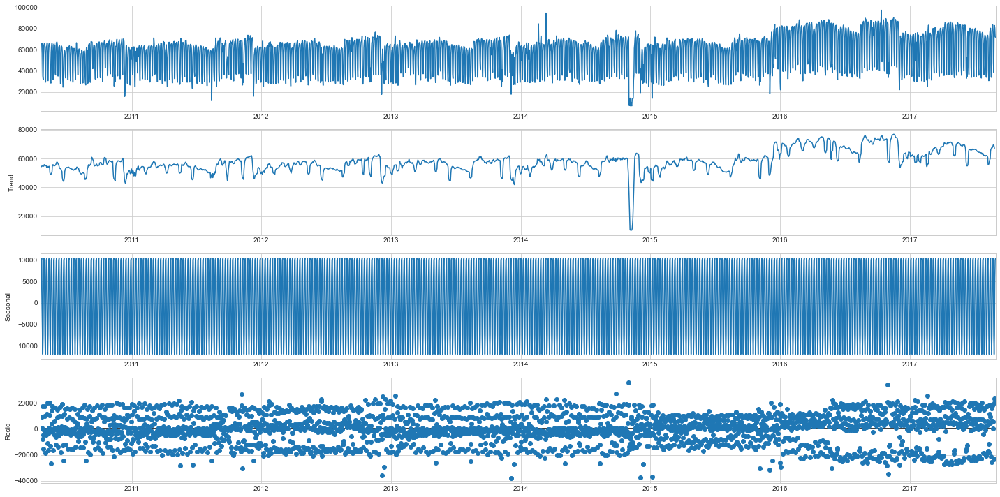

In [203]:
plt.style.use('seaborn-whitegrid')

plt.rcParams["figure.figsize"] = [20,10]
dplot = decomposed.plot()

<AxesSubplot:>

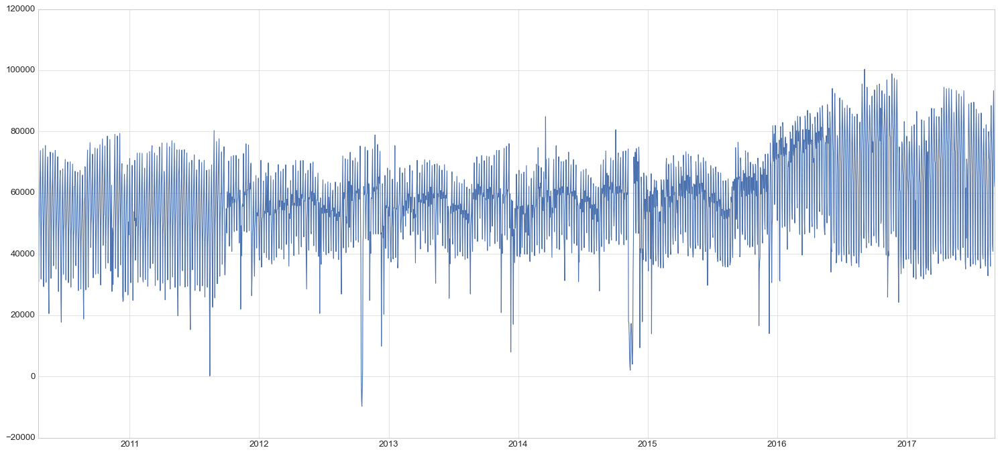

In [827]:
# Decomposed without Seasonal component

plt.style.use('seaborn-whitegrid')
plt.rcParams["figure.figsize"] = [23,10]

df_59_ts_adjusted = df_59_ts - decomposed.seasonal
df_59_ts_adjusted.plot()

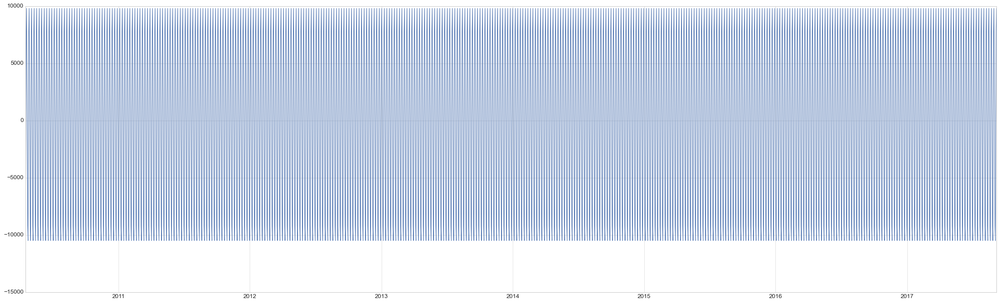

In [840]:
# Seasonal component of the decomposition
plt.style.use('seaborn-whitegrid')
plt.rcParams["figure.figsize"] = [35,10]

decomposed.seasonal.plot();

### Conclusion: noticeable Yearly trend repetition = Seasonality (not Cyclic only)

<hr />

<a class="anchor" id="part_18"></a>
## 4.2 59 ST 2017

In [501]:
# Seasonal Decomposition
# Simple seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
plt.rcParams["figure.figsize"] = [15,10]
plt.style.use('seaborn-whitegrid')

In [502]:
decomposed = seasonal_decompose(df_59_2017ts)

In [376]:
decomposed.trend, decomposed.seasonal, decomposed.resid

(2017-01-01             NaN
 2017-01-02             NaN
 2017-01-03             NaN
 2017-01-04    57805.142857
 2017-01-05    57864.142857
 2017-01-06    58123.714286
 2017-01-07    62412.571429
 2017-01-08    63361.285714
 2017-01-09    63282.285714
 2017-01-10    63505.285714
 2017-01-11    63376.571429
 2017-01-12    63565.428571
 2017-01-13    63967.571429
 2017-01-14    61344.714286
 2017-01-15    60655.571429
 2017-01-16    60601.000000
 2017-01-17    59907.285714
 2017-01-18    59794.714286
 2017-01-19    62421.857143
 2017-01-20    62445.000000
 2017-01-21    64553.142857
 2017-01-22    64307.571429
 2017-01-23    64175.714286
 2017-01-24    64260.000000
 2017-01-25    64107.428571
 2017-01-26    61425.428571
 2017-01-27    61218.142857
 2017-01-28    61339.142857
 2017-01-29    62051.571429
 2017-01-30    62018.428571
 2017-01-31    62265.142857
 2017-02-01    62532.857143
 2017-02-02    62106.285714
 2017-02-03    61458.000000
 2017-02-04    61465.000000
 2017-02-05    61535

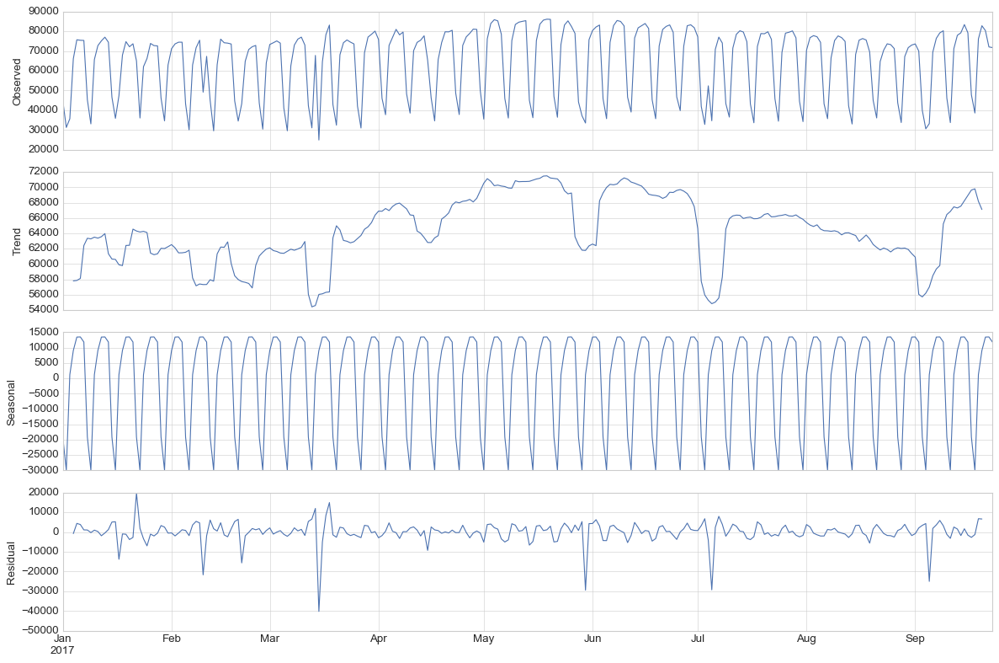

In [416]:
plt.style.use('seaborn-whitegrid')

plt.rcParams["figure.figsize"] = [15,10]
dplot = decomposed.plot()

<AxesSubplot:>

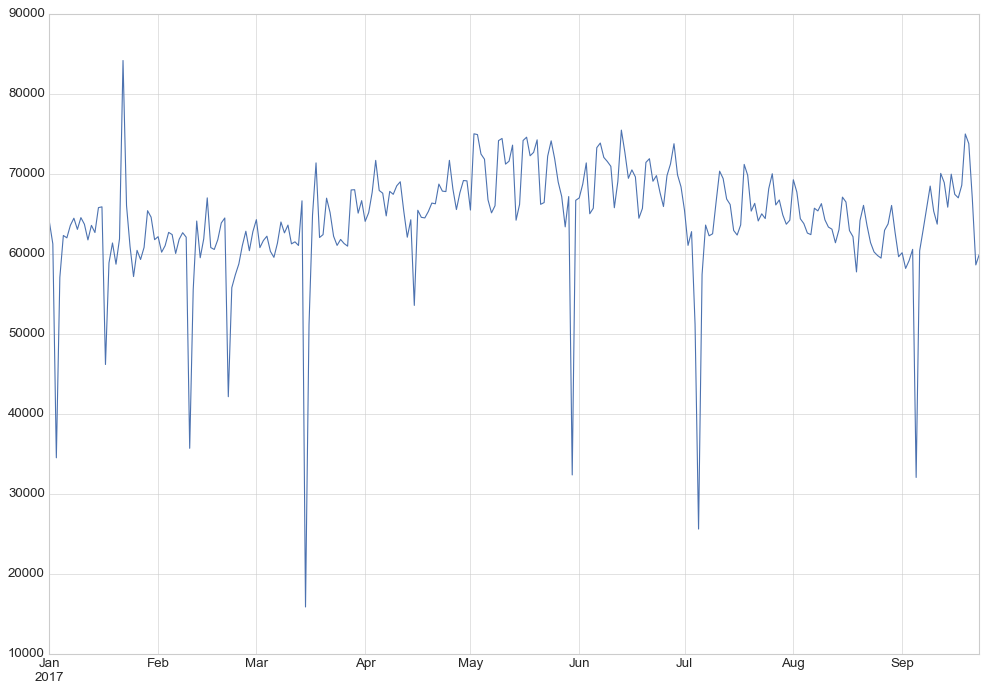

In [504]:
# Decomposed without Seasonal component

plt.style.use('seaborn-whitegrid')

df_59_2017ts_adjusted = df_59_2017ts - decomposed.seasonal
df_59_2017ts_adjusted.plot()

<AxesSubplot:>

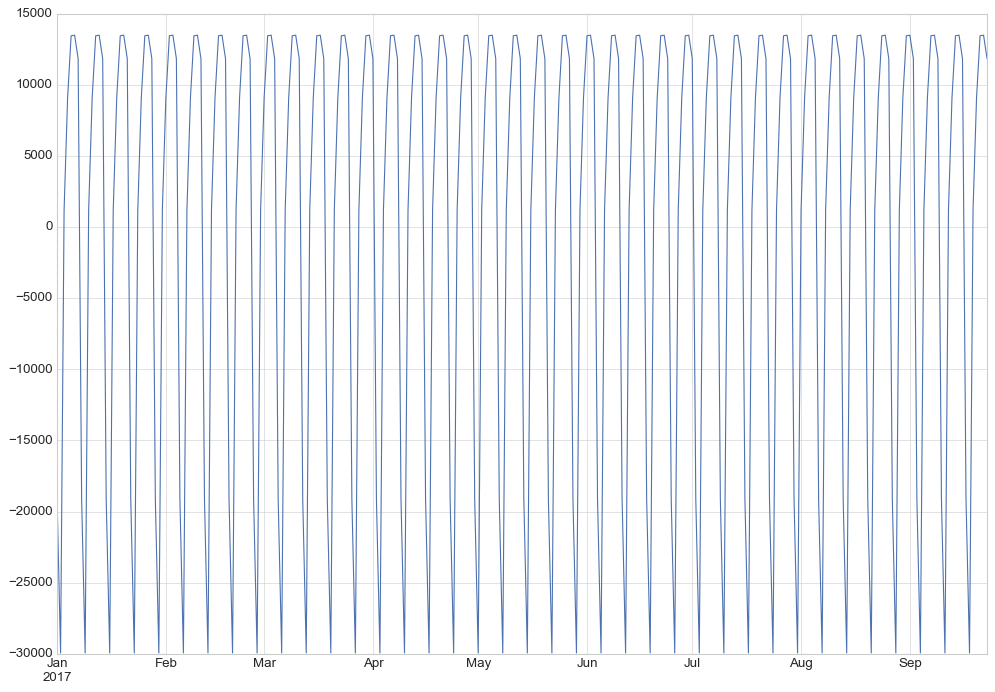

In [418]:
# Seasonal component of the decomposition

decomposed.seasonal.plot()

### Conclusion: noticeable Weekly trend repetition = confirmed Seasonality (not Cyclic only)

<hr />

<hr />

<a class="anchor" id="part_19"></a>
## 4.3 34 ST-PENN STA 2010-2017

In [755]:
# Seasonal Decomposition
# Simple seasonal decomposition

from statsmodels.tsa.seasonal import seasonal_decompose

In [760]:
plt.rcParams["figure.figsize"] = [15,10]
plt.style.use('seaborn-whitegrid')

In [208]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_34_ts = pd.Series(df_34_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2010-04-18',
                                           periods = 2675,
                                           freq = 'D'))


In [209]:
decomposed = seasonal_decompose(df_34_ts)

In [210]:
decomposed.trend, decomposed.seasonal, decomposed.resid

(2010-04-18              NaN
 2010-04-19              NaN
 2010-04-20              NaN
 2010-04-21    139887.285714
 2010-04-22    139495.857143
 2010-04-23    139090.571429
 2010-04-24    139984.142857
 2010-04-25    140259.142857
 2010-04-26    139595.571429
 2010-04-27    139530.571429
 2010-04-28    139570.000000
 2010-04-29    141724.285714
 2010-04-30    141692.000000
 2010-05-01    141632.000000
 2010-05-02    141868.714286
 2010-05-03    142976.285714
 2010-05-04    143287.285714
 2010-05-05    143618.571429
 2010-05-06    141732.714286
 2010-05-07    142377.571429
 2010-05-08    142247.285714
 2010-05-09    142284.857143
 2010-05-10    142592.571429
 2010-05-11    143138.000000
 2010-05-12    141630.285714
 2010-05-13    142841.714286
 2010-05-14    142532.428571
 2010-05-15    130392.857143
 2010-05-16    130867.857143
 2010-05-17    130338.857143
 2010-05-18    129894.285714
 2010-05-19    130882.428571
 2010-05-20    131392.142857
 2010-05-21    131161.857143
 2010-05-22   

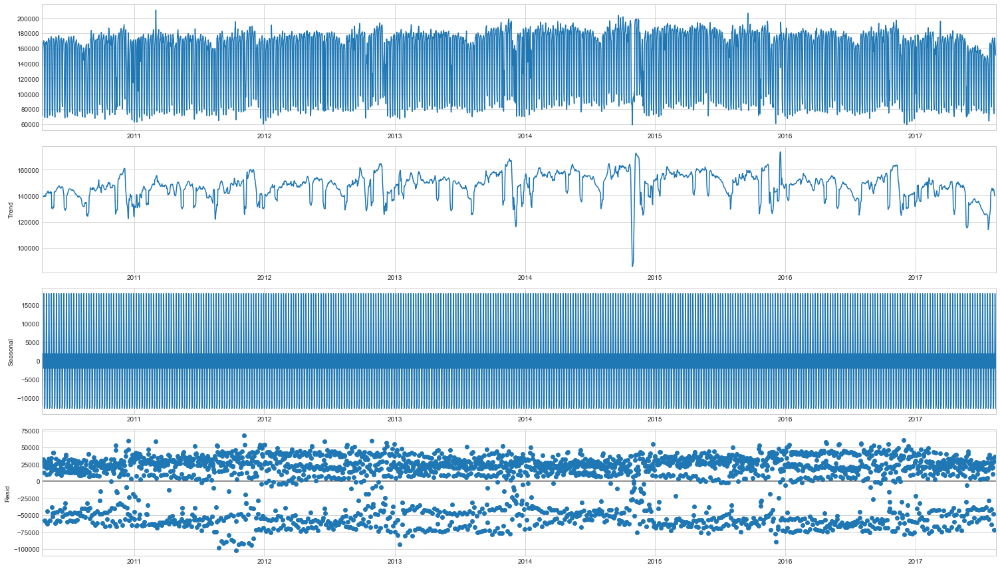

In [211]:
plt.rcParams["figure.figsize"] = [21,12]
dplot = decomposed.plot()

<AxesSubplot:>

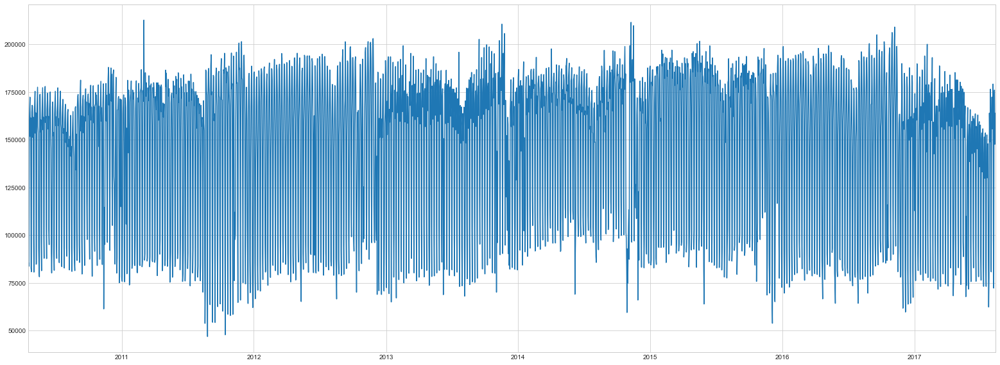

In [214]:
# Decomposed without Seasonal component
plt.rcParams["figure.figsize"] = [27,10]

df_34_ts_adjusted = df_34_ts - decomposed.seasonal
df_34_ts_adjusted.plot()

<AxesSubplot:>

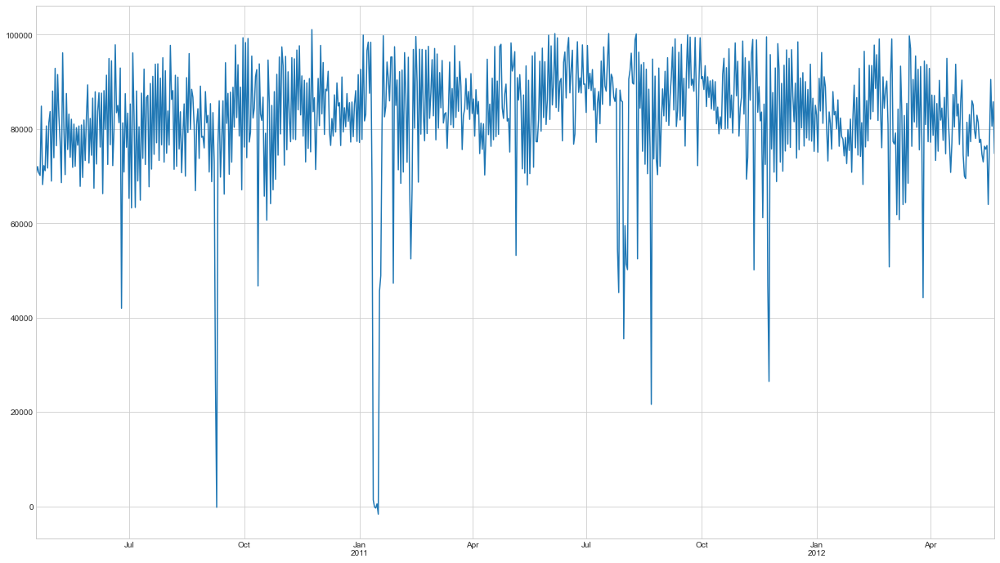

In [148]:
# Decomposed without Seasonal component

df_34_ts_adjusted = df_34_ts - decomposed.seasonal
df_34_ts_adjusted.plot()

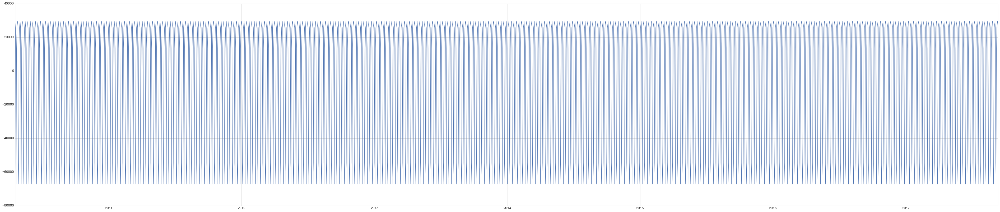

In [710]:
# Seasonal component of the decomposition

plt.rcParams["figure.figsize"] = [60,12]

plt.style.use('seaborn-whitegrid')

decomposed.seasonal.plot();

### Conclusion: noticeable Yearly trend repetition = confirmed Seasonality (not Cyclic only)

<hr />

<a class="anchor" id="part_20"></a>
## 4.4 34 ST-PENN STA 2017

In [737]:
# Seasonal Decomposition
# Simple seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

In [742]:
plt.rcParams["figure.figsize"] = [15,10]
plt.style.use('seaborn-whitegrid')

In [743]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_34_2017ts = pd.Series(df_34_2017_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2017-01-01',
                                           periods = 266,
                                           freq = 'D'))


In [744]:
decomposed = seasonal_decompose(df_34_2017ts)

In [745]:
decomposed.trend, decomposed.seasonal, decomposed.resid

(2017-01-01              NaN
 2017-01-02              NaN
 2017-01-03              NaN
 2017-01-04    134062.857143
 2017-01-05    131475.000000
 2017-01-06    129151.142857
 2017-01-07    140727.428571
 2017-01-08    141326.000000
 2017-01-09    140367.714286
 2017-01-10    139640.142857
 2017-01-11    139718.142857
 2017-01-12    140054.285714
 2017-01-13    139767.285714
 2017-01-14    130629.857143
 2017-01-15    130107.714286
 2017-01-16    130745.714286
 2017-01-17    130480.571429
 2017-01-18    130336.714286
 2017-01-19    130436.857143
 2017-01-20    131023.714286
 2017-01-21    140299.857143
 2017-01-22    140002.142857
 2017-01-23    139890.857143
 2017-01-24    140569.714286
 2017-01-25    140592.285714
 2017-01-26    140685.428571
 2017-01-27    140752.142857
 2017-01-28    140979.714286
 2017-01-29    141237.000000
 2017-01-30    141419.857143
 2017-01-31    140844.857143
 2017-02-01    141274.428571
 2017-02-02    141253.000000
 2017-02-03    141702.285714
 2017-02-04   

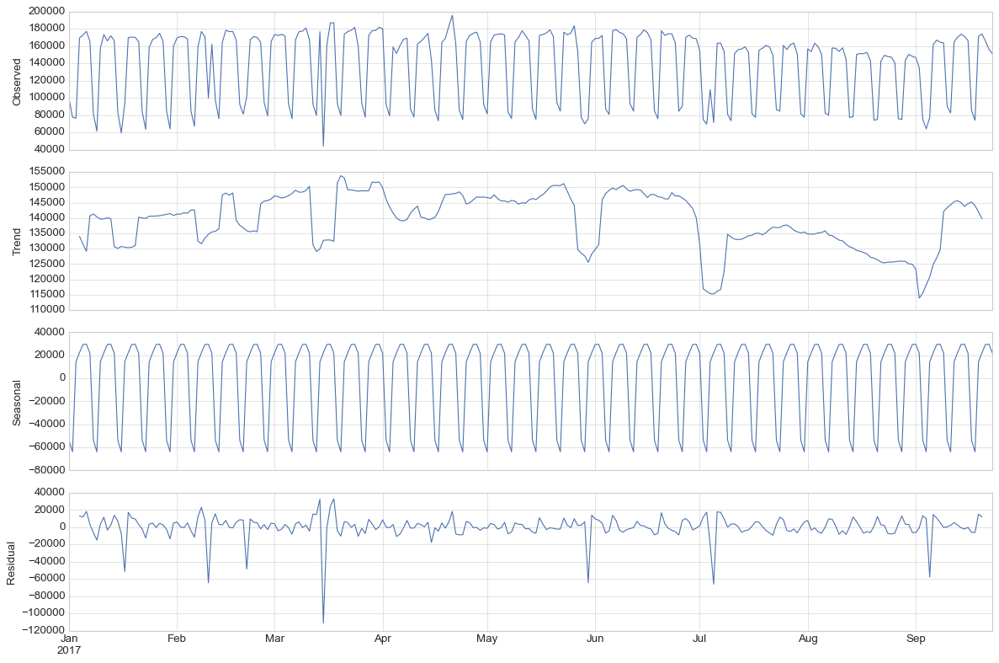

In [510]:
plt.style.use('seaborn-whitegrid')

dplot = decomposed.plot()

<AxesSubplot:>

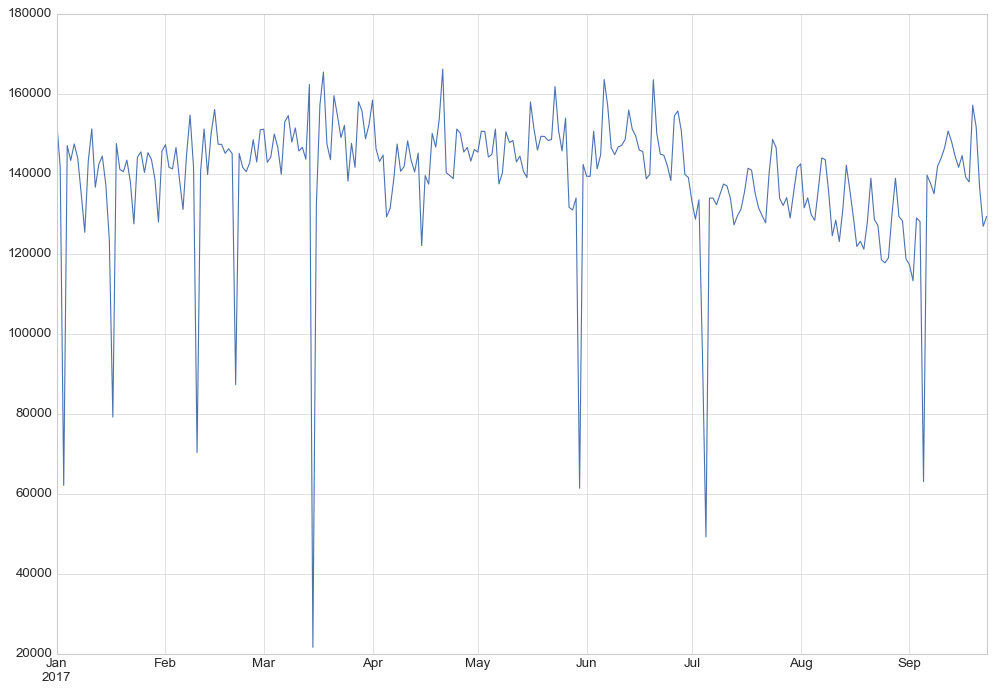

In [511]:
# Decomposed without Seasonal component

plt.style.use('seaborn-whitegrid')

df_34_2017ts_adjusted = df_34_2017ts - decomposed.seasonal
df_34_2017ts_adjusted.plot()

<AxesSubplot:>

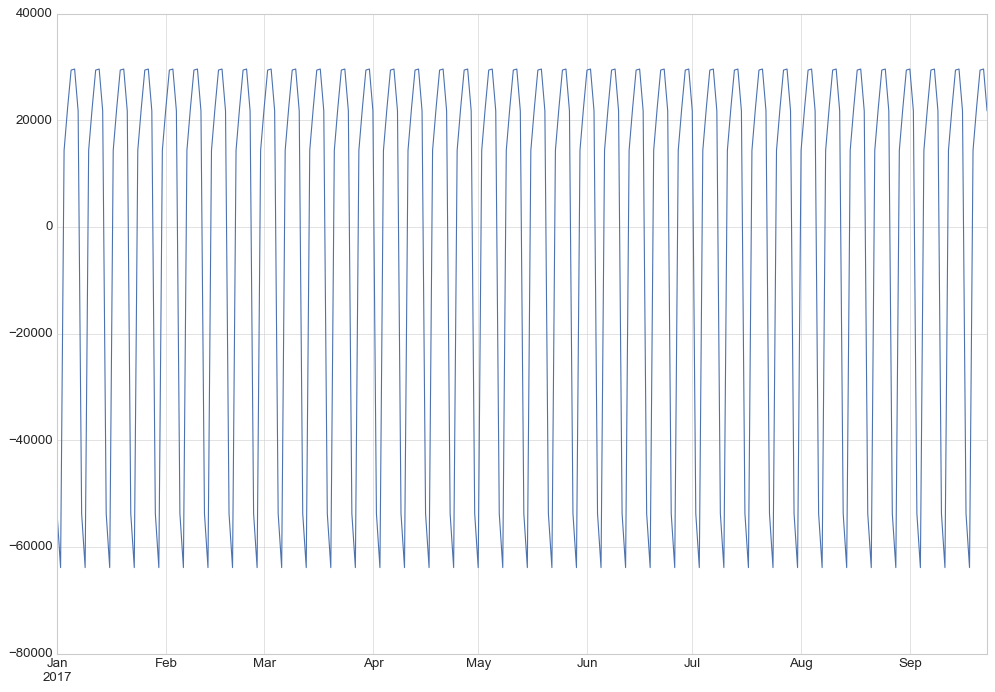

In [512]:
# Seasonal component of the decomposition

plt.style.use('seaborn-whitegrid')

decomposed.seasonal.plot()

### Conclusion: noticeable Weekly trend repetition = confirmed Seasonality (not Cyclic only)

<hr />

<hr />

## Conclusions: Stationarity and Seasonality tests

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.
### - We can infere there is a very high level of similarity between different stations, with respect to Seasonality. 
### - Sationarity pattern with respect to Trend is clear, unfolding a weekly and yearly based horizontal trend on stations' entries, respectively, observing the charts for each of the studied stations.

[Back to top](#topo).

<hr />

<a class="anchor" id="part_21"></a>
# 5. Autocorrelation Test

<a class="anchor" id="part_22"></a>
## 5.1 59 ST 2010-2017

In [298]:
# Classic ACF and PACF Plots for Autocorrelation
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [841]:
df_59_ts.head()

2010-04-18    32107.0
2010-04-19    30771.0
2010-04-20    56427.0
2010-04-21    64607.0
2010-04-22    66028.0
Freq: D, dtype: float64

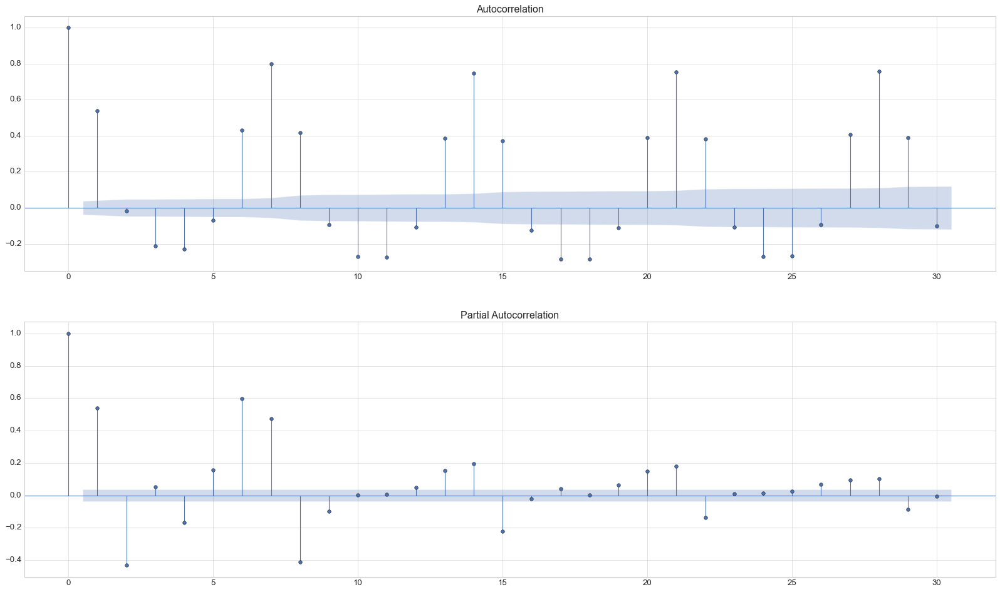

In [842]:
# Autocorrelation and partical autocorrelation in the dataset
# Two plots on one sheet
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(25,14))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_59_ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_59_ts, lags=30, ax=ax2);

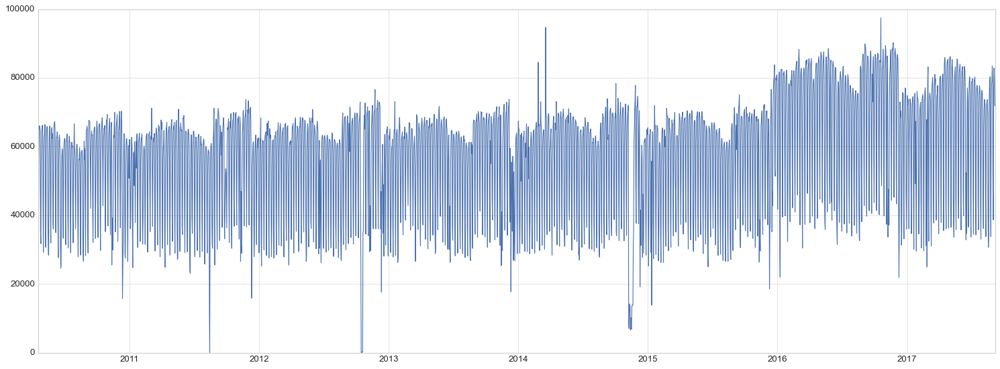

In [844]:
# Visualizing Time Series in Python
# Line graph with matplotlib pyplot module

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(23,8))
df_59_ts.plot();

In [846]:
# Plotting two series on the same plot
# Getting the cumsum of 59 ST 2017 data
# Series object, therefore the index is inherited

cumsum_df = np.cumsum(df_59_ts)

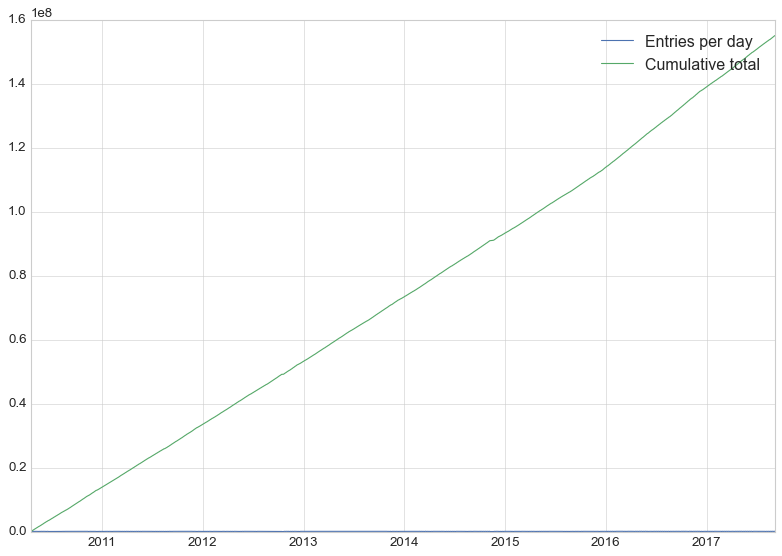

In [847]:
plt.figure(figsize=(12,8))
plt.plot(df_59_ts)
plt.plot(cumsum_df)
plt.legend(['Entries per day', 'Cumulative total']);

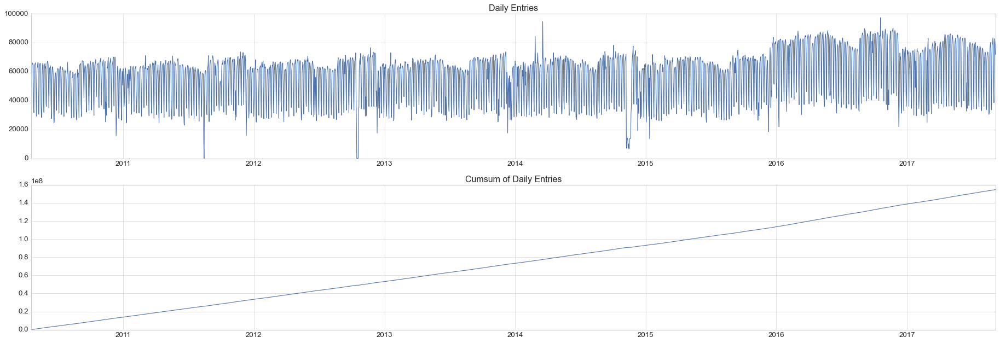

In [851]:
# Getting two visualizations in the same output cell

plt.figure(figsize=(23,8))
plt.subplot(2,1,1)
plt.plot(df_59_ts)
plt.title('Daily Entries')

plt.subplot(2,1,2)
plt.plot(cumsum_df)
plt.title('Cumsum of Daily Entries')
plt.tight_layout()

<hr />

<a class="anchor" id="part_23"></a>
## 5.2 59 ST 2017

In [711]:
# Classic ACF and PACF Plots for Autocorrelation
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [712]:
df_59_2017ts.head()

2017-01-01    44912.0
2017-01-02    31288.0
2017-01-03    35690.0
2017-01-04    66137.0
2017-01-05    75734.0
Freq: D, dtype: float64

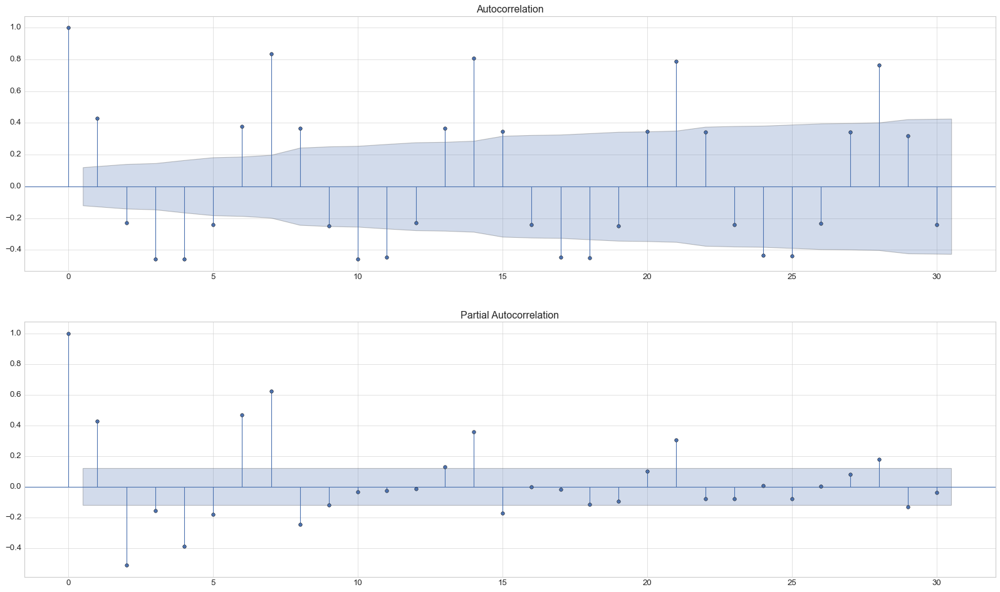

In [404]:
# Autocorrelation and partical autocorrelation in the dataset
# Two plots on one sheet
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(25,14))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_59_2017ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_59_2017ts, lags=30, ax=ax2);

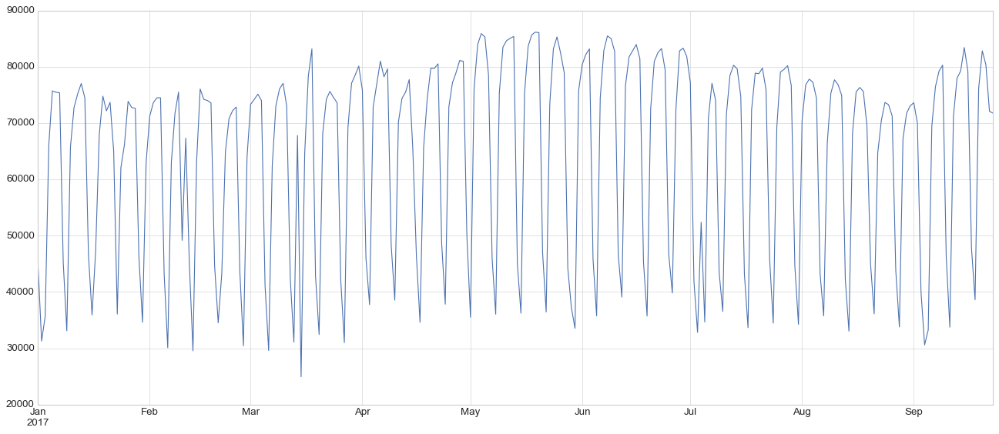

In [419]:
# Visualizing Time Series in Python
# Line graph with matplotlib pyplot module
plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(20,8))
df_59_2017ts.plot();

In [853]:
# Plotting two series on the same plot
# Getting the cumsum of 59 ST 2017 data
# Series object, therefore the index is inherited
cumsum_df = np.cumsum(df_59_2017ts)

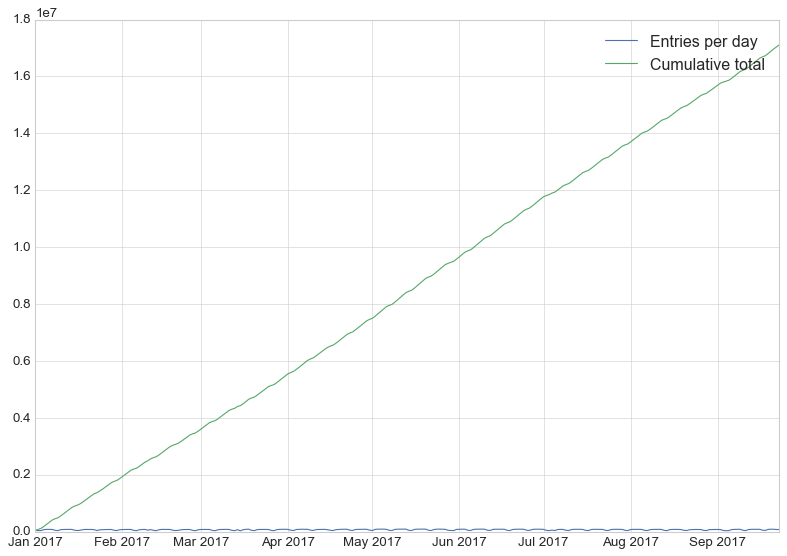

In [410]:
plt.figure(figsize=(12,8))
plt.plot(df_59_2017ts)
plt.plot(cumsum_df)
plt.legend(['Entries per day', 'Cumulative total']);

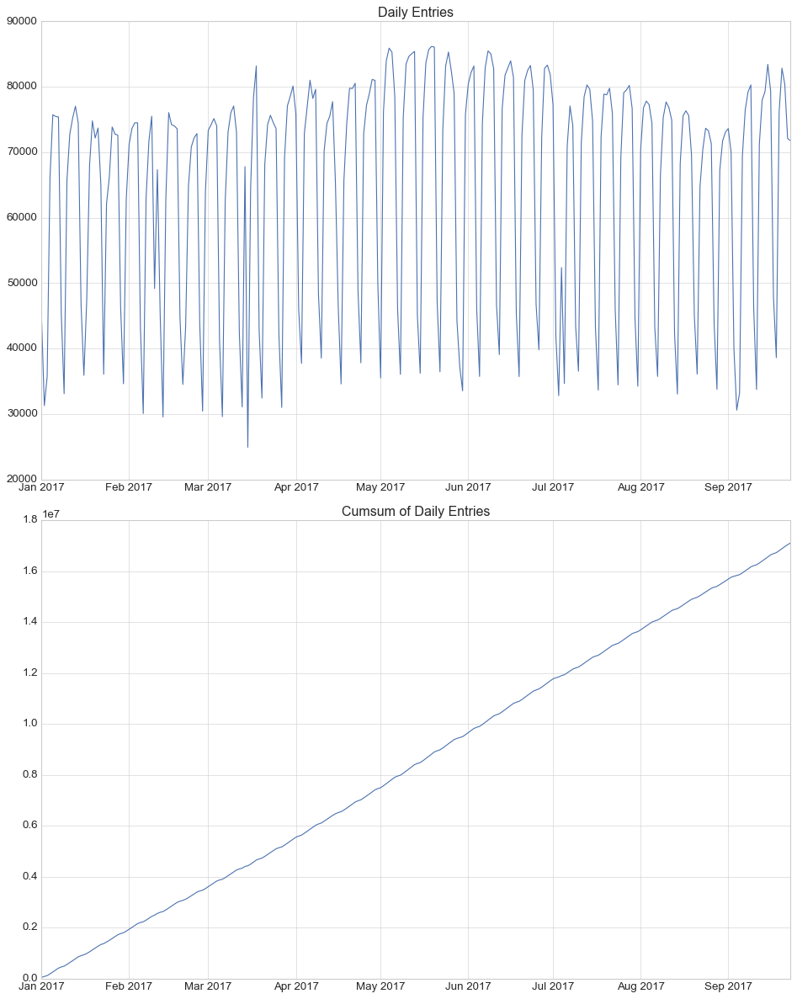

In [411]:
# Getting two visualizations in the same output cell
plt.figure(figsize=(12,15))
plt.subplot(2,1,1)
plt.plot(df_59_2017ts)
plt.title('Daily Entries')

plt.subplot(2,1,2)
plt.plot(cumsum_df)
plt.title('Cumsum of Daily Entries')
plt.tight_layout()

<hr />

<hr />

<a class="anchor" id="part_24"></a>
## 5.3 34 ST-PENN STA 2010-2017

In [149]:
# Classic ACF and PACF Plots for Autocorrelation
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [150]:
df_34_ts.head()

2010-04-18    72727.0
2010-04-19    71734.0
2010-04-20    69987.0
2010-04-21    68897.0
2010-04-22    85067.0
Freq: D, dtype: float64

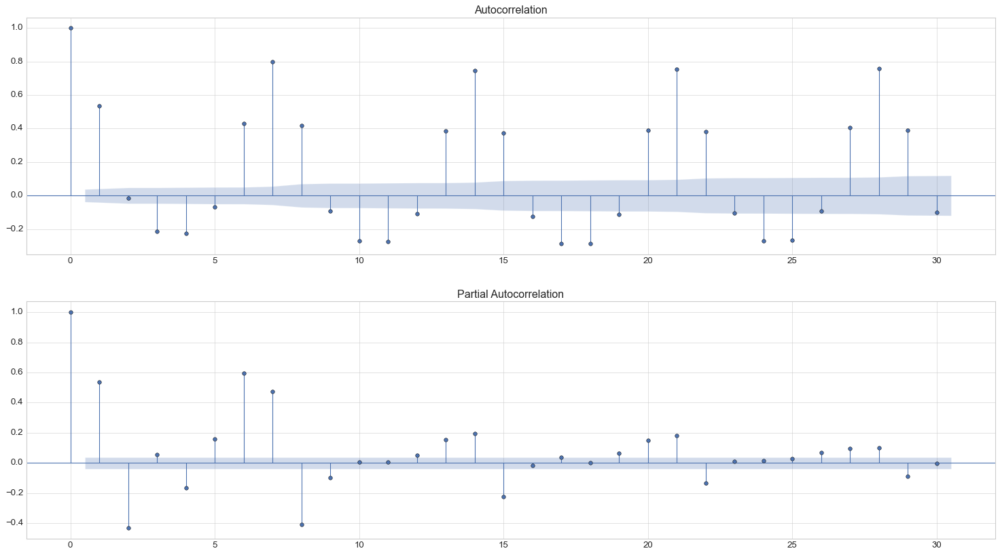

In [856]:
# Autocorrelation and partical autocorrelation in the dataset
# Two plots on one sheet
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(23,12))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_34_ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_34_ts, lags=30, ax=ax2);

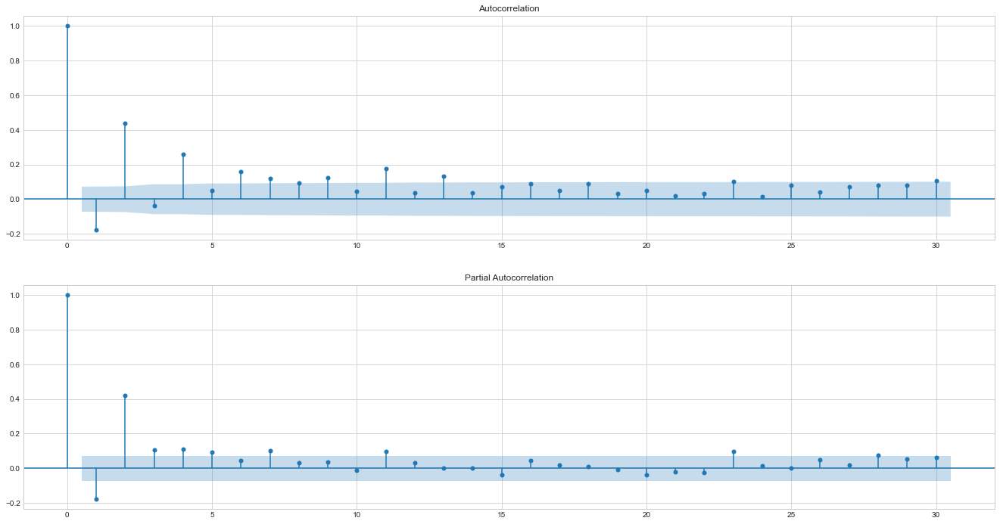

In [161]:
# Autocorrelation and partical autocorrelation in the dataset
# Two plots on one sheet
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(23,12))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_34_ts2, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_34_ts2, lags=30, ax=ax2);

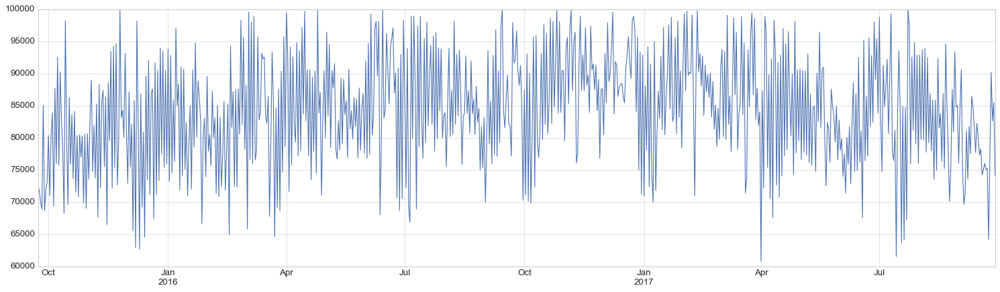

In [728]:
# Visualizing Time Series in Python
# Line graph with matplotlib pyplot module

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(23,6))
df_34_ts2.plot();

In [158]:
# Plotting two series on the same plot
# Getting the cumsum of 59 ST 2017 data
# Series object, therefore the index is inherited

cumsum_df = np.cumsum(df_34_ts2)

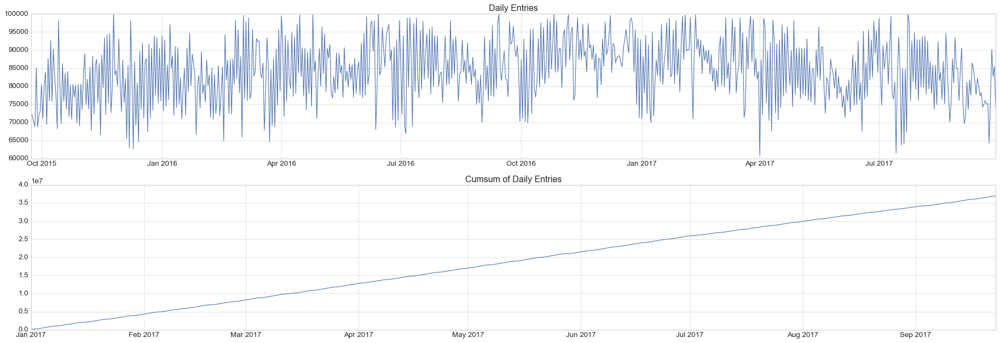

In [767]:
# Getting two visualizations in the same output cell

plt.figure(figsize=(23,8))
plt.subplot(2,1,1)
plt.plot(df_34_ts2)
plt.title('Daily Entries')

plt.subplot(2,1,2)
plt.plot(cumsum_df)
plt.title('Cumsum of Daily Entries')
plt.tight_layout()

<hr />

<a class="anchor" id="part_25"></a>
## 5.4 34 ST-PENN STA 2017

In [396]:
# Classic ACF and PACF Plots for Autocorrelation
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [175]:
df_34['date'] = pd.to_datetime(df_34['date'])

In [176]:
df_34_2017 = df_34[df_34['date']>= '2017-01-01']

In [178]:
df_34_2017_date = df_34_2017.groupby('date').sum('DAILY_ENTRIES')

In [181]:
# Converting the DataFrame into a Series object
# New index generation with proper date index

df_34_2017ts = pd.Series(df_34_2017_date['DAILY_ENTRIES'].values,
                     index = pd.date_range('2017-01-01',
                                           periods = 266,
                                           freq = 'D'))


In [182]:
df_34_2017ts.tail()

2017-09-19    171538.0
2017-09-20    174029.0
2017-09-21    165741.0
2017-09-22    156502.0
2017-09-23    151131.0
Freq: D, dtype: float64

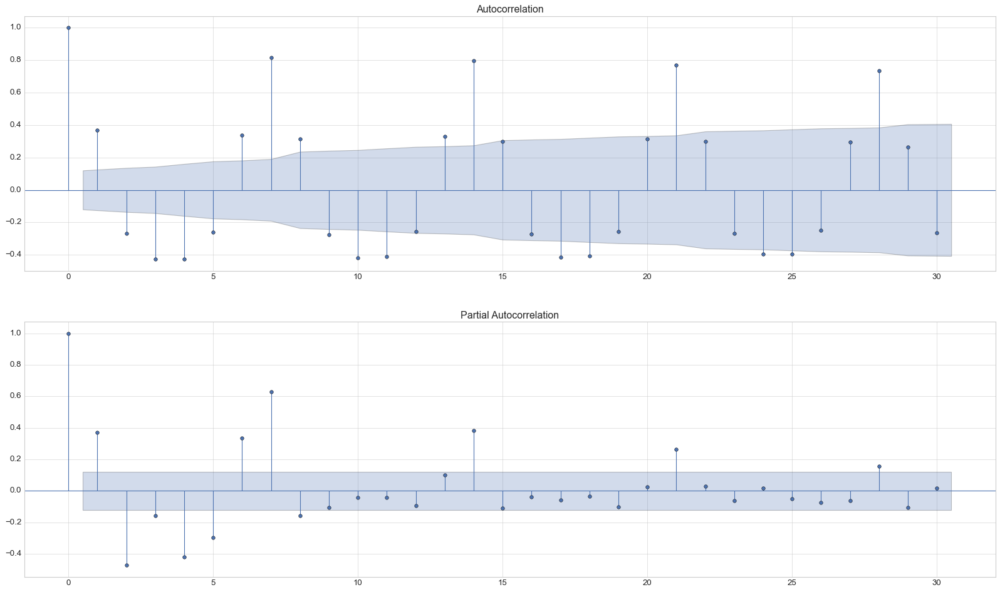

In [533]:
# Autocorrelation and partical autocorrelation in the dataset
# Two plots on one sheet
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(25,14))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_34_2017ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_34_2017ts, lags=30, ax=ax2);

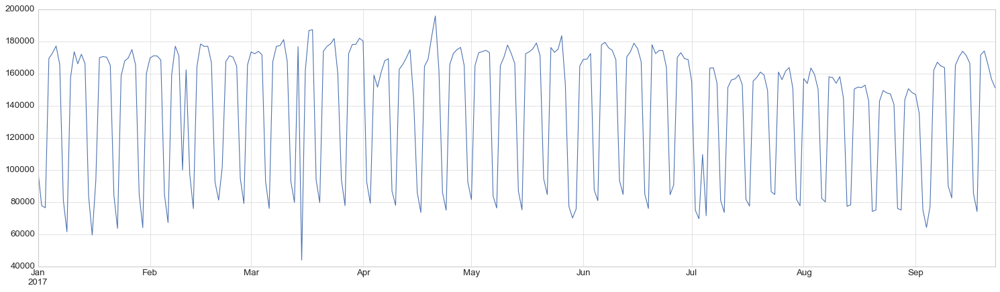

In [564]:
# Visualizing Time Series in Python
# Line graph with matplotlib pyplot module

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(23,6))
df_34_2017ts.plot();

In [535]:
# Plotting two series on the same plot
# Getting the cumsum of 59 ST 2017 data
# Series object, therefore the index is inherited

cumsum_df = np.cumsum(df_34_2017ts)

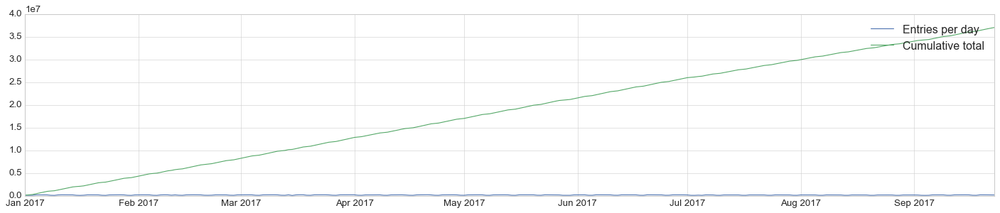

In [552]:
plt.figure(figsize=(22,4))
plt.plot(df_34_2017ts)
plt.plot(cumsum_df)
plt.legend(['Entries per day', 'Cumulative total']);

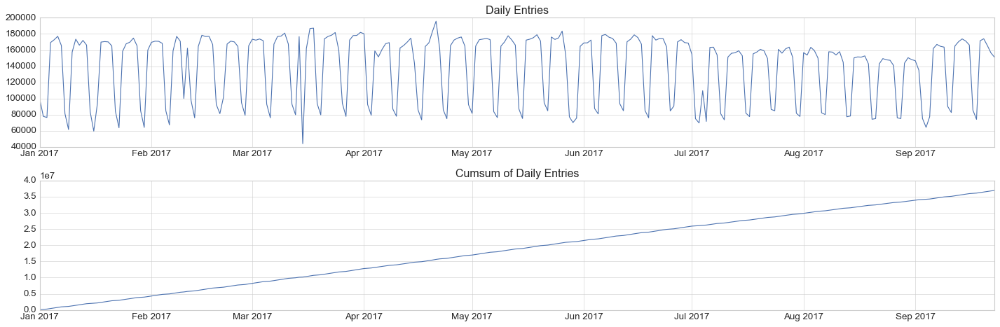

In [549]:
# Getting two visualizations in the same output cell

plt.figure(figsize=(18,6))
plt.subplot(2,1,1)
plt.plot(df_34_2017ts)
plt.title('Daily Entries')

plt.subplot(2,1,2)
plt.plot(cumsum_df)
plt.title('Cumsum of Daily Entries')
plt.tight_layout()

<hr />

## Conclusions

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.
### - There is evidence Autocorrelation levels for both stations, both in weekly and yearly data, is very high, reaching the value of +- 20 autocorrelated days.

<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_26"></a>
# 6. Rolling Mean

In [187]:
# Simple moving (rolling) calculations
# Note: the rolling methods are applicable only on pandas Series and DataFrame objects

def plot_rolling(timeseries, window):
    rol_mean = timeseries.rolling(window).mean()
    rol_std = timeseries.rolling(window).std()
    
    fig = plt.figure(figsize = (23, 8))
    og = plt.plot(timeseries, color = "blue", label = "Original")
    mean = plt.plot(rol_mean, color = "red", label = "Rolling Mean")
    std = plt.plot(rol_std, color = "black", label = "Rolling Std")
    plt.legend(loc = "best")
    plt.title("Rolling Mean and Standard Deviation (window = "+str(window)+")")
    plt.show()

<Figure size 1840x640 with 0 Axes>

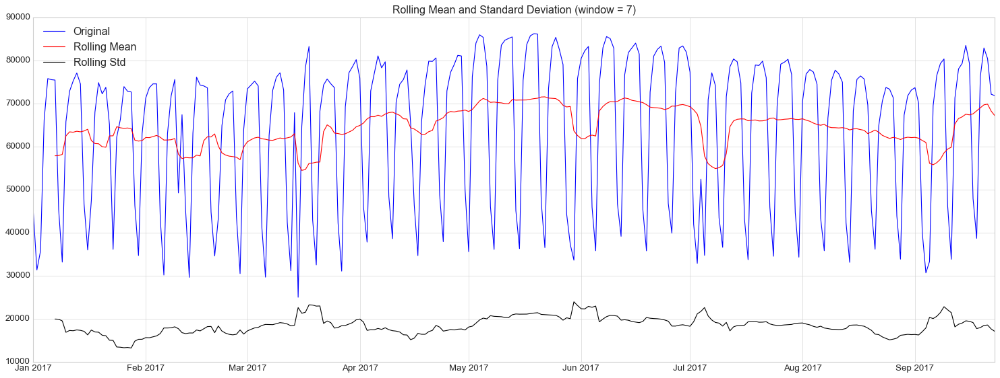

In [578]:
# Plotting the rolling mean calculated

plot_rolling(df_59_2017ts,7);

In [632]:
# Getting the smooth values only

# df_59_2017ts.rolling(
#     window: 'int | timedelta | BaseOffset | BaseIndexer',
#     min_periods: 'int | None' = None,
#     center: 'bool_t' = False,
#     win_type: 'str | None' = None,
#     on: 'str | None' = None,
#     axis: 'Axis' = 0,
#     closed: 'str | None' = None,
#     method: 'str' = 'single',
# )


df_59_2017ts.rolling(7).mean()

2017-01-01             NaN
2017-01-02             NaN
2017-01-03             NaN
2017-01-04             NaN
2017-01-05             NaN
2017-01-06             NaN
2017-01-07    57805.142857
2017-01-08    57864.142857
2017-01-09    58123.714286
2017-01-10    62412.571429
2017-01-11    63361.285714
2017-01-12    63282.285714
2017-01-13    63505.285714
2017-01-14    63376.571429
2017-01-15    63565.428571
2017-01-16    63967.571429
2017-01-17    61344.714286
2017-01-18    60655.571429
2017-01-19    60601.000000
2017-01-20    59907.285714
2017-01-21    59794.714286
2017-01-22    62421.857143
2017-01-23    62445.000000
2017-01-24    64553.142857
2017-01-25    64307.571429
2017-01-26    64175.714286
2017-01-27    64260.000000
2017-01-28    64107.428571
2017-01-29    61425.428571
2017-01-30    61218.142857
2017-01-31    61339.142857
2017-02-01    62051.571429
2017-02-02    62018.428571
2017-02-03    62265.142857
2017-02-04    62532.857143
2017-02-05    62106.285714
2017-02-06    61458.000000
2

In [190]:
# Simple rolling calculation with minimum number of periods

def plot_rolling2(timeseries, window):
    rol_mean = timeseries.rolling(window, min_periods = 1).mean()
    rol_std = timeseries.rolling(window, min_periods = 1).std()
    
    fig = plt.figure(figsize = (23, 8))
    og = plt.plot(timeseries, color = "blue", label = "Original")
    mean = plt.plot(rol_mean, color = "red", label = "Rolling Mean")
    std = plt.plot(rol_std, color = "black", label = "Rolling Std")
    plt.legend(loc = "best")
    plt.title("Rolling Mean and Standard Deviation (window = "+str(window)+")")
    plt.show()

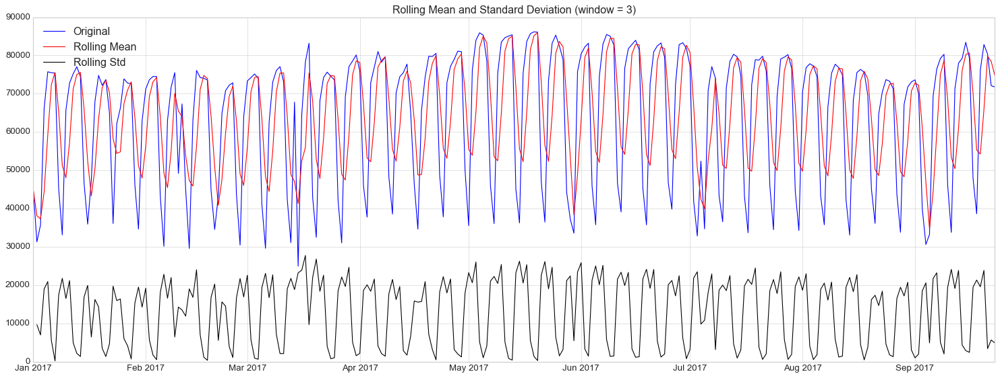

In [635]:
# No NA values, but shorter window size

plot_rolling2(df_59_2017ts, 3)

In [634]:
# Getting the smooth values only - minimum periods = 1

df_59_2017ts.rolling(3, min_periods = 1).mean()

2017-01-01    44912.000000
2017-01-02    38100.000000
2017-01-03    37296.666667
2017-01-04    44371.666667
2017-01-05    59187.000000
2017-01-06    72451.666667
2017-01-07    75536.333333
2017-01-08    65400.000000
2017-01-09    51273.666667
2017-01-10    48047.333333
2017-01-11    57198.333333
2017-01-12    71223.666667
2017-01-13    75001.333333
2017-01-14    75572.000000
2017-01-15    66060.666667
2017-01-16    52352.333333
2017-01-17    43306.333333
2017-01-18    50408.666667
2017-01-19    63368.333333
2017-01-20    71647.333333
2017-01-21    73563.333333
2017-01-22    70309.333333
2017-01-23    58273.666667
2017-01-24    54409.333333
2017-01-25    54808.666667
2017-01-26    67406.666667
2017-01-27    70963.333333
2017-01-28    73096.333333
2017-01-29    63892.000000
2017-01-30    51176.000000
2017-01-31    47950.000000
2017-02-01    56269.666667
2017-02-02    69274.000000
2017-02-03    73124.000000
2017-02-04    74219.333333
2017-02-05    64097.000000
2017-02-06    49292.666667
2

<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_27"></a>
# 7. Moving Average 

In [192]:
# Exponentially Weighted Moving Average
# Note: the ewm method is applicable on pandas Series and DataFrame objects only

def plot_ewma(timeseries, alpha):
    expw_ma = timeseries.ewm(alpha=alpha).mean()

    fig = plt.figure(figsize = (23, 8))
    og_line = plt.plot(timeseries, color = "blue", label = "Original")
    exwm_line = plt.plot(expw_ma, color = "red", label = "EWMA")
    plt.legend(loc = "best")
    plt.title("EWMA (alpha= "+str(alpha)+")")
    plt.show()

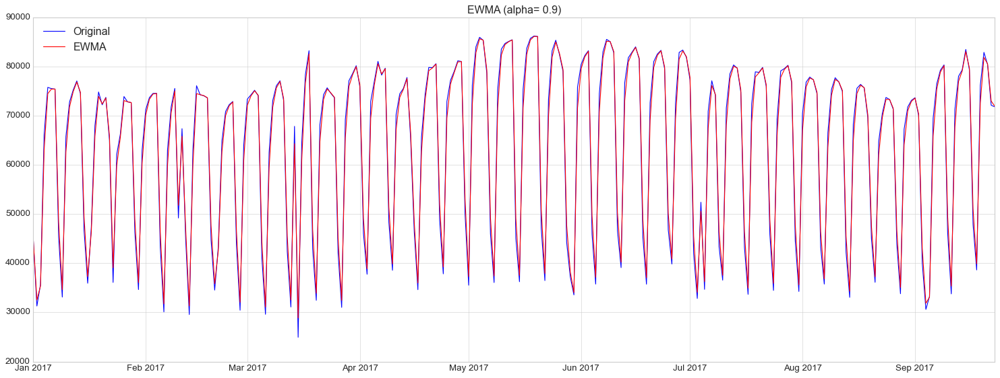

In [620]:
plot_ewma(df_59_2017ts, 0.9)

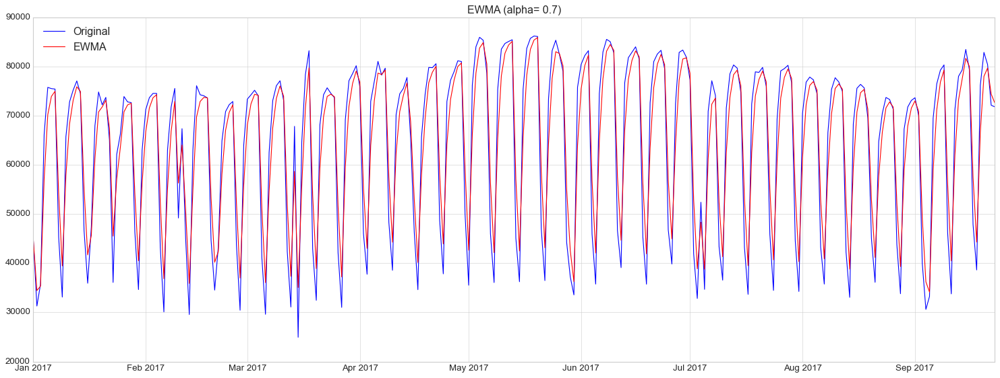

In [636]:
plot_ewma(df_59_2017ts, 0.7)

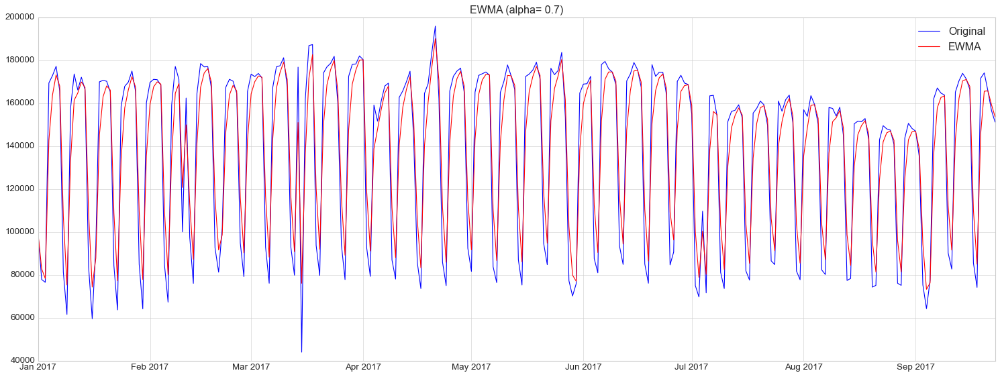

In [618]:
plot_ewma(df_34_2017ts, 0.7)

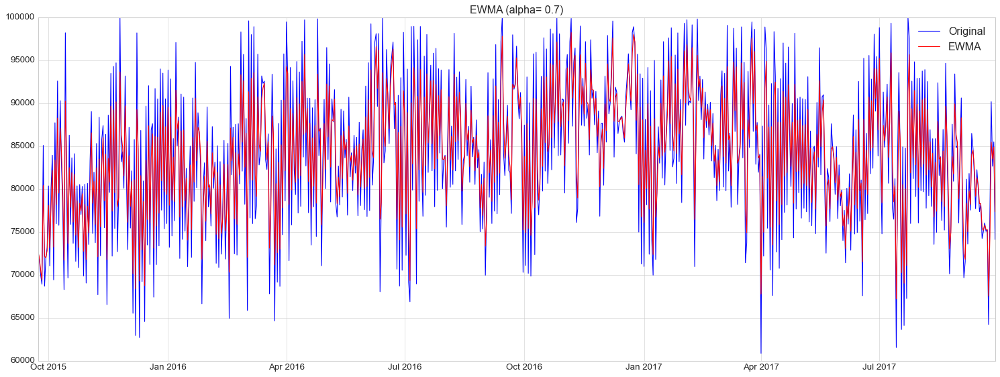

In [727]:
plot_ewma(df_34_ts2, 0.7)

<hr />

## Conclusions: Rolling Mean and Moving Average tests

### - We observed data from 2 major NYC Metro stations. #1 in number of instances is 34 ST-PENN STATION, another top 10 station is 59 ST.

### - The rolling mean (RM) and the moving average (MA) are not complicated to calculate and, once plotted on a chart, are a powerful visual trend-spotting tool and technical indicator.

### - They indicated a catchable pattern of trend, especially when using small window (RM) and small alpha (MA).


[Back to top](#topo).

<hr />

<hr />

<a class="anchor" id="part_II"></a>
# Part II - Prediction Models

### We will consider this event as stochastic, and as the proposed solution to tackle this problem, will apply Time Series forecasting.
### There will be a Frequentist approach, developing two variations of the classic ARIMA model, and in comparison to, a Bayesian approach, applying PyMC3 Monte Carlo Simulations Markov Chais.


<a class="anchor" id="part_28"></a>
# 8. Frequentist Approach - ARIMA Models

### Two variations of the same classic model for Time Series analysis, under a frequentist approach, will be performed over two variations of the same dataset in order to test their efficience:
### - ARIMA (2,0,2) and ARIMA (4,0,2)
### - Datasets: "59 Station year 2017" slice of the original dataset, and "59 Station years 2010-2017" slice of the original dataset

<br />

### Autoregressive Integrated Moving Average (ARIMA) model, and extensions

- integration model: ARIMA(p, d, q)

- autoregressive models: AR(p)
- moving average models: MA(q)
- differences: diff(d)

order : tuple, optional
    The (p,d,q) order of the model for the autoregressive, differences, and
    moving average components. d is always an integer, while p and q may
    either be integers or lists of integers.


<a class="anchor" id="part_29"></a>
## 8.1 59 ST only year 2017

In [299]:
# ARIMA Model Setup

from statsmodels.tsa.arima.model import ARIMA

In [300]:
# ARIMA Parameter Selection
# Note the date format (DatetimeIndex + tuple) is required for the ARIMA function we'll use below

df_59_2017ts = pd.Series(df_59_2017_date['DAILY_ENTRIES'].values,
                 index = pd.DatetimeIndex(data = (tuple(pd.date_range('2017-01-01',
                                                                      periods = 266,
                                                                      freq = 'D'))),
                                          freq = 'D'))

In [301]:
# Test for stationarity - Parameter d
# Applying the Augmented Dickey-Fuller test function we created in the previous section

stationarity_test(df_59_2017ts)

Results of Dickey-Fuller Test:
Test Statistic                  -2.478271
p-value                          0.120851
#Lags Used                      14.000000
Number of Observations Used    251.000000
dtype: float64


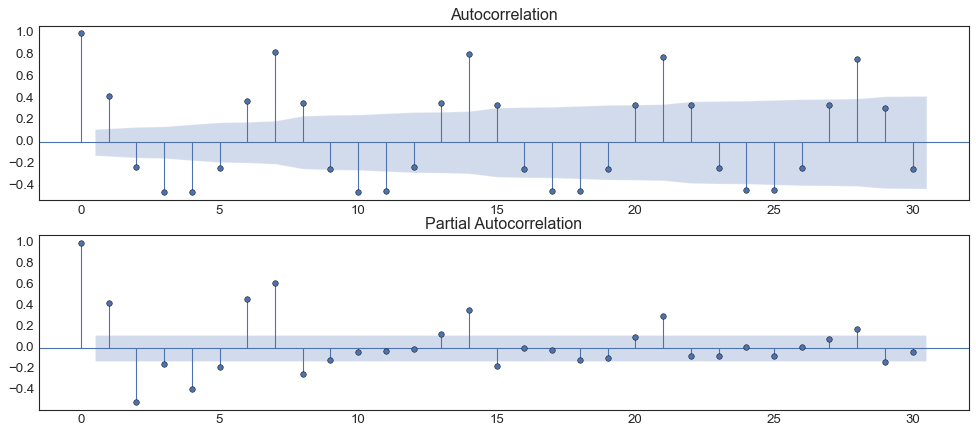

In [795]:
# Remembering the high levels for autocorrelation and partical autocorrelation - Parameters p, q
sns.set_style("white")

fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_59_2017ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_59_2017ts, lags=30, ax=ax2);

<hr />

[Back to top](#topo).

<a class="anchor" id="part_30"></a>
## 8.1.1 ARIMA 2

In [303]:
# Checking the Residuals: A Close Look
# Example performed on an AR2 model

# AR2
model = ARIMA(df_59_2017ts, order=(2, 0, 2))  
results_AR = model.fit();

In [304]:
# The last 5 observations for the original data, the fitted values and the residuals

df_59_2017ts.tail()

2017-09-19    76170.0
2017-09-20    82851.0
2017-09-21    80386.0
2017-09-22    72100.0
2017-09-23    71776.0
Freq: D, dtype: float64

In [310]:
results_AR.fittedvalues.tail()

2017-09-19    56242.326831
2017-09-20    73973.389836
2017-09-21    84445.749050
2017-09-22    79596.483863
2017-09-23    63117.857351
Freq: D, dtype: float64

In [311]:
results_AR.resid.tail() 

2017-09-19    19927.673169
2017-09-20     8877.610164
2017-09-21    -4059.749050
2017-09-22    -7496.483863
2017-09-23     8658.142649
Freq: D, dtype: float64

In [312]:
# The (absolute) mean of the residuals

np.mean(abs(results_AR.resid))

8560.633661635478

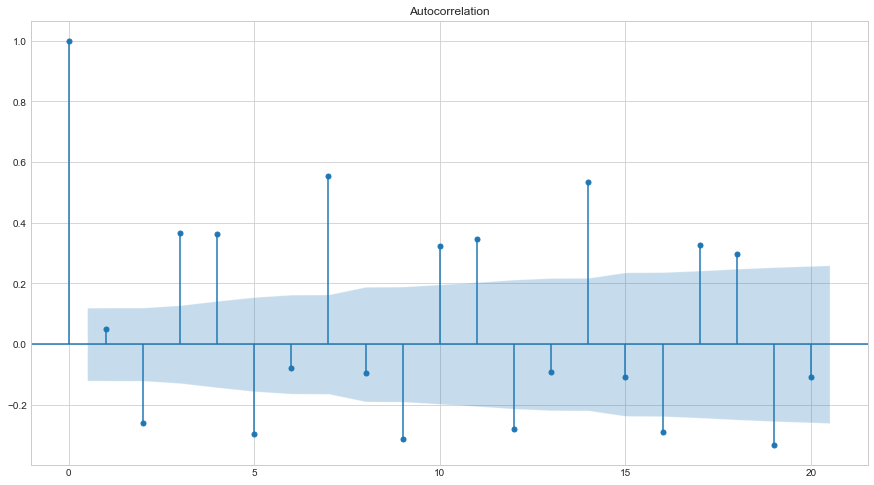

In [313]:
# ACF Plot on Residuals of Our Model
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(15,18))
ax1 = fig.add_subplot(211)
fig = plot_acf(results_AR.resid, lags=20, ax=ax1);

# Conclusion: Medium autocorrelation, a good sign

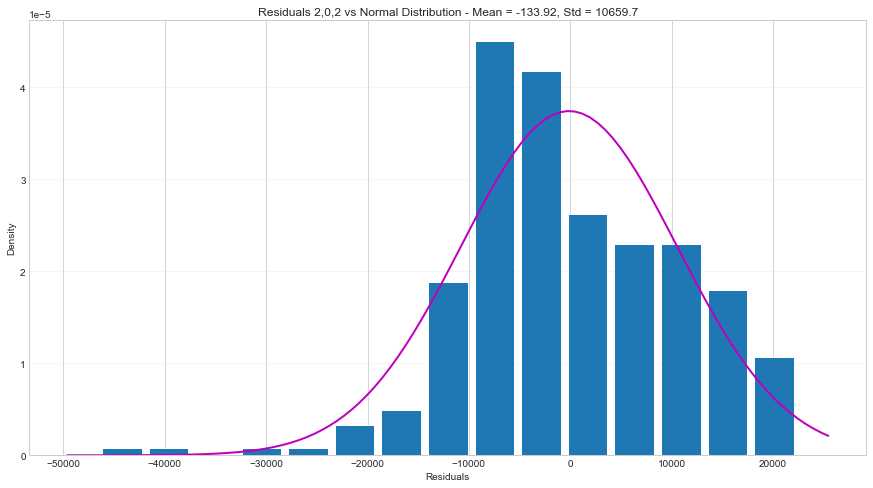

In [314]:
# Histogram on the residuals

plt.figure(figsize = (15, 8))
plt.hist(results_AR.resid, bins = 'auto', density = True, rwidth = 0.85, label = 'Residuals') #density TRUE - norm.dist bell curve
mu, std = norm.fit(results_AR.resid)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100) #linspace returns evenly spaced numbers over a specified interval
p = norm.pdf(x, mu, std) #pdf = probability density function
plt.plot(x, p, 'm', linewidth = 2)
plt.grid(axis='y', alpha = 0.2)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Residuals 2,0,2 vs Normal Distribution - Mean = '+str(round(mu,2))+', Std = '+str(round(std,2)))
plt.show()

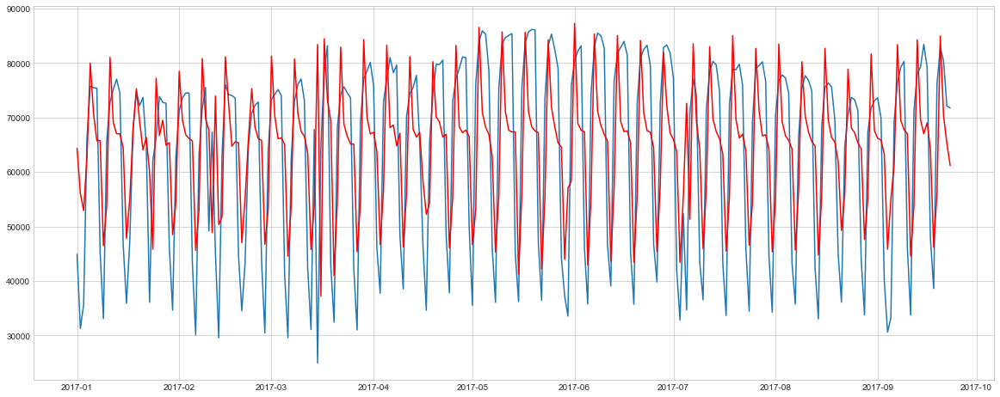

In [264]:
# Using ARIMA for the model, with the argument 'order'

model = ARIMA(df_59_2017ts, order=(2, 0, 2))  
results_AR = model.fit()
plt.figure(figsize=(20,8))
plt.plot(df_59_2017ts)
plt.plot(results_AR.fittedvalues, color='red');

<hr />

## Model Evaluation

In [316]:
# Model Diagnostics  - ARIMA 2,0,2

results_AR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  266
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -2854.651
Date:                Sat, 08 Oct 2022   AIC                           5721.302
Time:                        15:25:20   BIC                           5742.803
Sample:                    01-01-2017   HQIC                          5729.940
                         - 09-23-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.433e+04   1094.522     58.776      0.000    6.22e+04    6.65e+04
ar.L1          1.2453      0.003    437.015      0.000       1.240       1.251
ar.L2         -0.9999      0.001  -1160.928      0.000      -1.002      -0.998
ma.L1         -1.2308      0.076    -16.216      0.000      -1.380      -1.082
ma.L2          0.9996      0.105      9.476      0.000       0.793       1.206
sigma2        1.7e+08      0.000   4.63e+11      0.000     1.7e+08     1.7e+08
===================================================================================
Ljung-Box (L1) (Q):                   0.35   Jarque-Bera (JB):                15.36
Prob(Q):                              0.55   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                            -0.23
Prob(H) (two-sided):                  0.40   Kurtosis:                         4.08
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.38e+29. Standard errors may be unstable.
"""

In [317]:
dataset_mean = df_59_2017ts.mean()
dataset_mean

64331.46240601504

In [318]:
dataset_mae = mean_absolute_error(df_59_2017ts, results_AR.fittedvalues)
dataset_mae

8560.633661635477

In [319]:
Accuracy = 1 - (dataset_mae / df_59_2017ts.mean())
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.8669


### Acuracy = 0.8669 or 86,69% fitted on Training Set

<hr />

[Back to top](#topo).

<a class="anchor" id="part_31"></a>
## 8.1.2 ARIMA 4

In [309]:
# Checking the Residuals: A Close Look
# Performed on an AR4 model

# AR4
model = ARIMA(df_59_2017ts, order=(4, 0, 2))  
results_AR = model.fit();

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



In [323]:
# The last 5 observations for the original data, the fitted values and the residuals

df_59_2017ts.tail()

2017-09-19    76170.0
2017-09-20    82851.0
2017-09-21    80386.0
2017-09-22    72100.0
2017-09-23    71776.0
Freq: D, dtype: float64

In [324]:
results_AR.fittedvalues.tail()

2017-09-19    60548.234944
2017-09-20    79634.099277
2017-09-21    72509.973838
2017-09-22    77284.817306
2017-09-23    61672.673484
Freq: D, dtype: float64

In [325]:
results_AR.resid.tail() 

2017-09-19    15621.765056
2017-09-20     3216.900723
2017-09-21     7876.026162
2017-09-22    -5184.817306
2017-09-23    10103.326516
Freq: D, dtype: float64

In [326]:
# The (absolute) mean of the residuals

np.mean(abs(results_AR.resid))

7800.015187985701

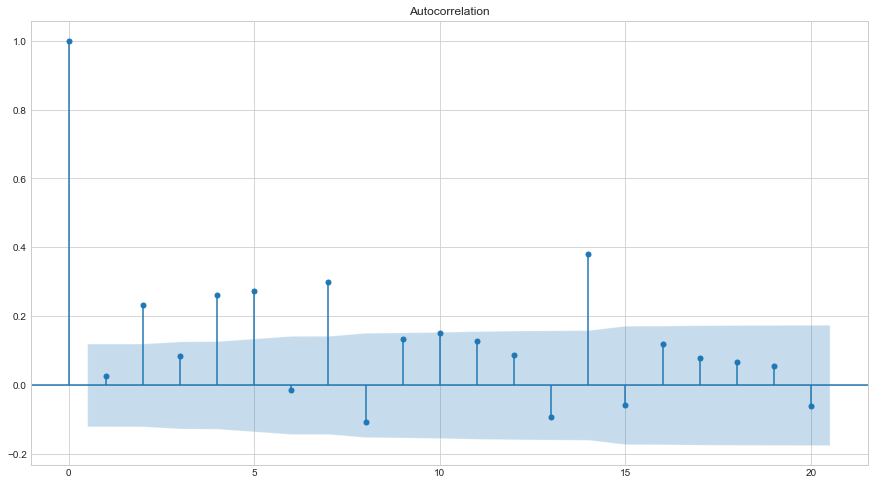

In [327]:
# ACF Plot on Residuals of Our Model
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(15,18))
ax1 = fig.add_subplot(211)
fig = plot_acf(results_AR.resid, lags=20, ax=ax1);

# Conclusion: LOW autocorrelation, a good sign

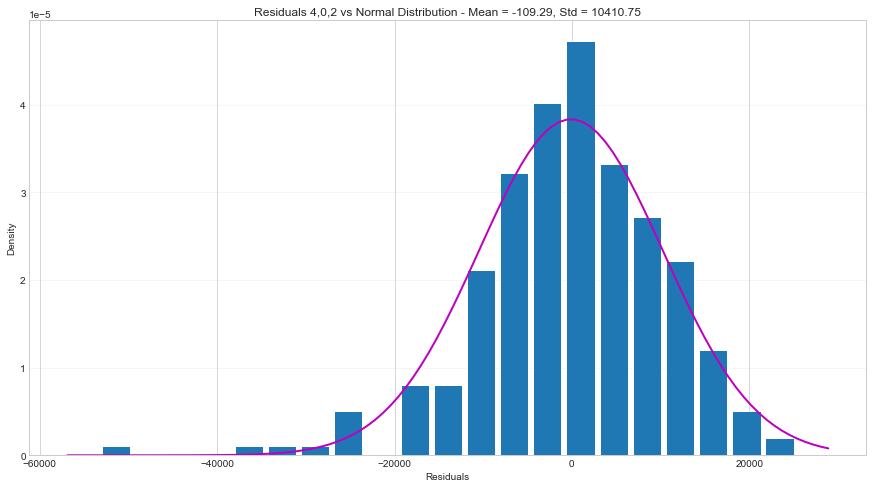

In [328]:
# Histogram on the residuals

plt.figure(figsize = (15, 8))
plt.hist(results_AR.resid, bins = 'auto', density = True, rwidth = 0.85, label = 'Residuals') #density TRUE - norm.dist bell curve
mu, std = norm.fit(results_AR.resid)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100) #linspace returns evenly spaced numbers over a specified interval
p = norm.pdf(x, mu, std) #pdf = probability density function
plt.plot(x, p, 'm', linewidth = 2)
plt.grid(axis='y', alpha = 0.2)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Residuals 4,0,2 vs Normal Distribution - Mean = '+str(round(mu,2))+', Std = '+str(round(std,2)))
plt.show()

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


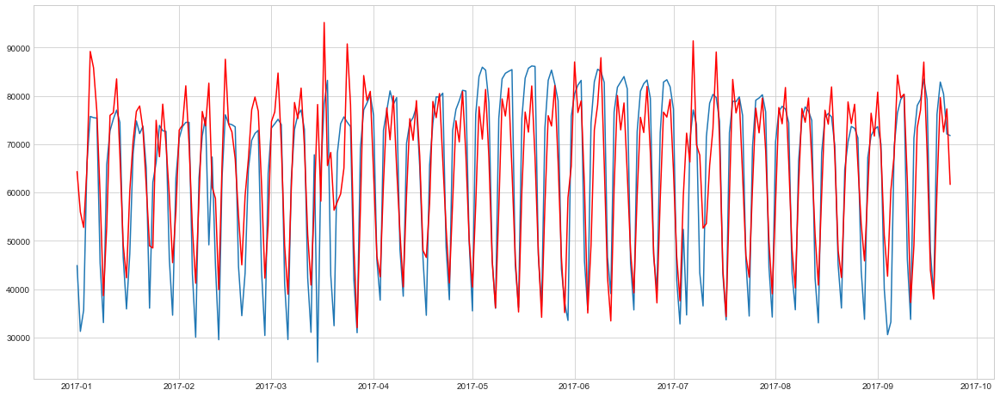

In [329]:
# Using ARIMA for the model, with the argument 'order'

model = ARIMA(df_59_2017ts, order=(4, 0, 2))  
results_AR = model.fit()
plt.figure(figsize=(20,8))
plt.plot(df_59_2017ts)
plt.plot(results_AR.fittedvalues, color='red');

<hr />

## Model Evaluation

In [330]:
# Model Diagnostics - ARIMA 4,0,2

results_AR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  266
Model:                 ARIMA(4, 0, 2)   Log Likelihood               -2837.256
Date:                Sat, 08 Oct 2022   AIC                           5690.513
Time:                        15:27:07   BIC                           5719.181
Sample:                    01-01-2017   HQIC                          5702.030
                         - 09-23-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.433e+04    641.242    100.323      0.000    6.31e+04    6.56e+04
ar.L1          0.8573      0.066     13.088      0.000       0.729       0.986
ar.L2         -1.2448      0.091    -13.690      0.000      -1.423      -1.067
ar.L3          0.5480      0.085      6.457      0.000       0.382       0.714
ar.L4         -0.6798      0.064    -10.561      0.000      -0.806      -0.554
ma.L1         -0.5223      0.069     -7.544      0.000      -0.658      -0.387
ma.L2          0.7436      0.070     10.560      0.000       0.606       0.882
sigma2      1.194e+08      0.015   7.91e+09      0.000    1.19e+08    1.19e+08
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               120.17
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.68   Skew:                            -0.84
Prob(H) (two-sided):                  0.08   Kurtosis:                         5.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.69e+25. Standard errors may be unstable.
"""

In [331]:
dataset_mean = df_59_2017ts.mean()
dataset_mean

64331.46240601504

In [332]:
dataset_mae = mean_absolute_error(df_59_2017ts, results_AR.fittedvalues)
dataset_mae

7800.015187985695

In [333]:
Accuracy = 1 - (dataset_mae / df_59_2017ts.mean())
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.8788


### Acuracy = 0.8788 or 87,88% fitted on Training Set

<hr />

[Back to top](#topo).

<a class="anchor" id="part_32"></a>
## 8.1.3 ARIMA 2 and ARIMA 4 Forecasts

### ARIMA 2,0,2 Forecast

In [316]:
# For the comparison, let's set up another model
# Arima(2,0,2) model and its fitted values

model202 = ARIMA(df_59_2017ts, order=(2, 0, 2))  
results_M202 = model202.fit()

In [317]:
# Forecast based on the ARIMA(2,0,2) model

Fcast202 = results_M202.predict(start = '2017-09-24',
                                  end = '2017-12-31')

### ARIMA 4,0,2 Forecast

In [318]:
# ARIMA forecasts
# Setting up an ARIMA(4,0,2) model and storing its fitted values

model_AR4 = ARIMA(df_59_2017ts, order=(4, 0, 2))  
results_AR4 = model_AR4.fit();

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



In [319]:
# Forecast based on the ARIMA(4,0,2) model

Fcast400 = results_AR4.predict(start = '2017-09-24',
                                 end = '2017-12-31')

## PREDICTIONS

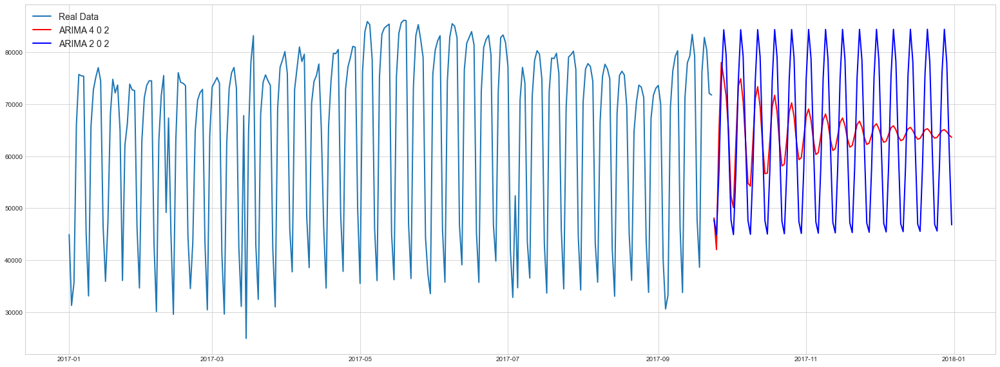

In [307]:
# Comparing the forecasts via data visualization - ARIMA 4 vs ARIMA 2

plt.figure(figsize = (27, 12))

plt.plot(df_59_2017ts, linewidth = 2, label = "Real Data")
plt.plot(Fcast400, color='red', linewidth = 2,
         label = "ARIMA 4 0 2")
plt.plot(Fcast202, color='blue', linewidth = 2,
         label = "ARIMA 2 0 2")

plt.legend(loc=0, prop={'size': 14});

<hr />

## Conclusion

### - The model ARIMA 4 performed only 1% above ARIMA 2, with respect to Training Set, but from the Forecasts analysis, it is clear this model has the ability to perform way better with unseen data. 

<hr />

[Back to top](#topo).

<a class="anchor" id="part_33"></a>
## 8.2 59 ST years 2010-2017

In [370]:
# ARIMA Model Setup

from statsmodels.tsa.arima.model import ARIMA

In [371]:
# ARIMA Parameter Selection
# Note the date format (DatetimeIndex + tuple) is required for the ARIMA function we'll use below

df_59_ts = pd.Series(df_59_date['DAILY_ENTRIES'].values,
                 index = pd.DatetimeIndex(data = (tuple(pd.date_range('2010-04-18',
                                                                      periods = 2699,
                                                                      freq = 'D'))),
                                          freq = 'D'))

In [372]:
# Test for stationarity - Parameter d
# Applying the Augmented Dickey-Fuller test function we created in the previous section

stationarity_test(df_59_ts)

Results of Dickey-Fuller Test:
Test Statistic                   -4.139473
p-value                           0.000833
#Lags Used                       28.000000
Number of Observations Used    2670.000000
dtype: float64


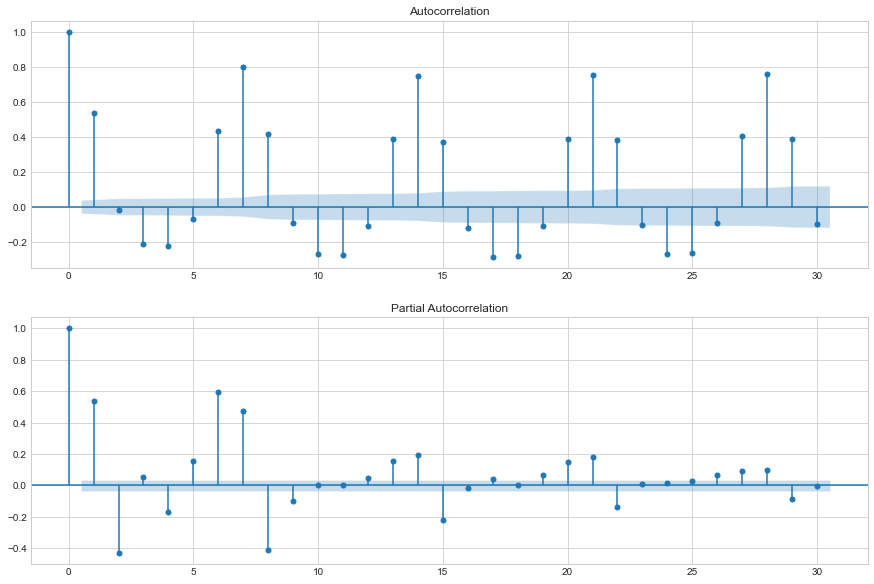

In [344]:
# Remembering the high levels for autocorrelation and partical autocorrelation - Parameters p, q
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = plot_acf(df_59_ts, lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(df_59_ts, lags=30, ax=ax2);

<hr />

[Back to top](#topo).

<a class="anchor" id="part_34"></a>
## 8.2.1 ARIMA 2

In [283]:
# Checking the Residuals: A Close Look
# Performed on an AR2 model

# AR2
model = ARIMA(df_59_ts, order=(2, 0, 2))  
results_AR = model.fit();

In [284]:
# The last 5 observations for the original data, the fitted values and the residuals

df_59_ts.tail()

2017-08-27    76170.0
2017-08-28    82851.0
2017-08-29    80386.0
2017-08-30    72100.0
2017-08-31    71776.0
Freq: D, dtype: float64

In [285]:
results_AR.fittedvalues.tail()

2017-08-27    49046.930042
2017-08-28    79913.520174
2017-08-29    66071.101109
2017-08-30    65997.896872
2017-08-31    58704.325877
Freq: D, dtype: float64

In [286]:
results_AR.resid.tail() 

2017-08-27    27123.069958
2017-08-28     2937.479826
2017-08-29    14314.898891
2017-08-30     6102.103128
2017-08-31    13071.674123
Freq: D, dtype: float64

In [287]:
# The (absolute) mean of the residuals

np.mean(abs(results_AR.resid))

9958.996420228512

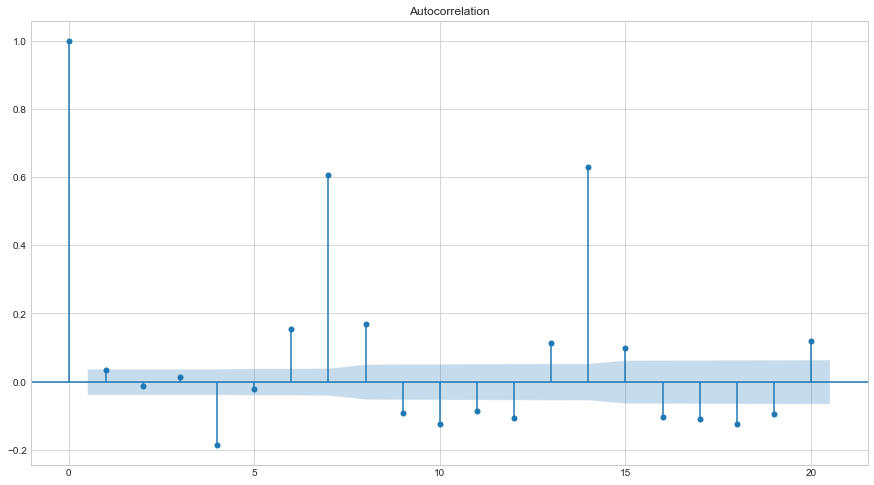

In [378]:
# ACF Plot on Residuals of Our Model
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(15,18))
ax1 = fig.add_subplot(211)
fig = plot_acf(results_AR.resid, lags=20, ax=ax1);

# Conclusion: Medium autocorrelation, a good sign

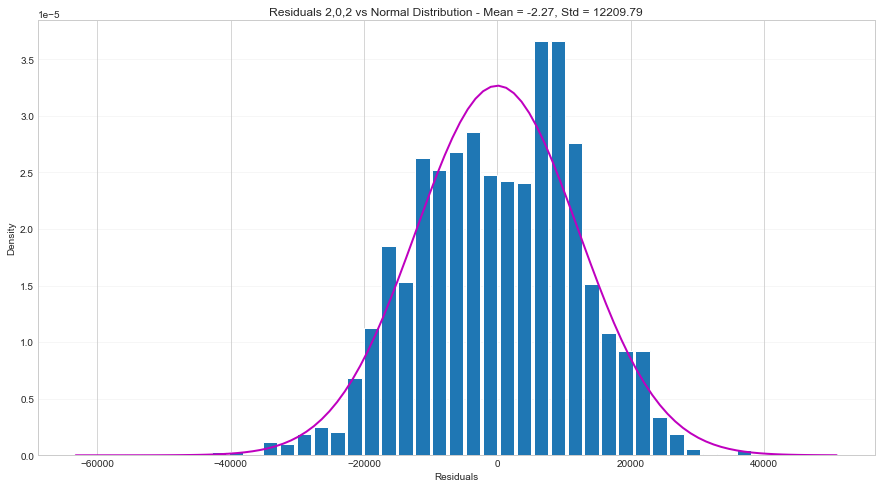

In [352]:
# Histogram on the residuals

plt.figure(figsize = (15, 8))
plt.hist(results_AR.resid, bins = 'auto', density = True, rwidth = 0.85, label = 'Residuals') #density TRUE - norm.dist bell curve
mu, std = norm.fit(results_AR.resid)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100) #linspace returns evenly spaced numbers over a specified interval
p = norm.pdf(x, mu, std) #pdf = probability density function
plt.plot(x, p, 'm', linewidth = 2)
plt.grid(axis='y', alpha = 0.2)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Residuals 2,0,2 vs Normal Distribution - Mean = '+str(round(mu,2))+', Std = '+str(round(std,2)))
plt.show()

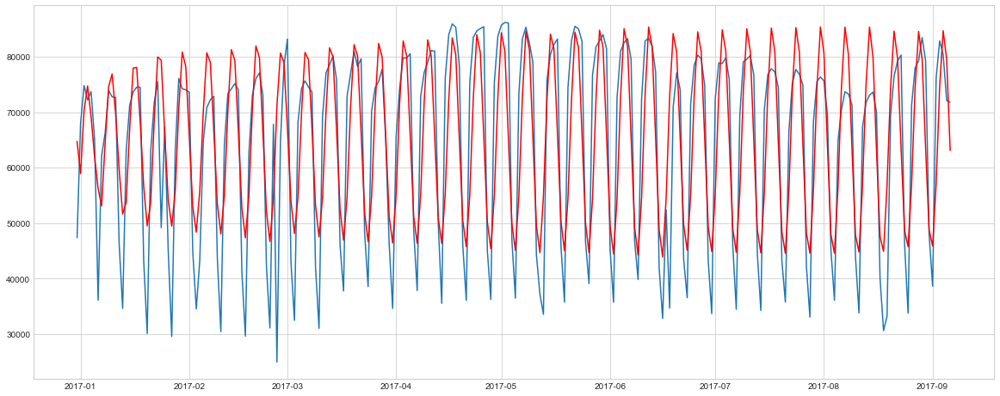

In [366]:
# A CLOSER LOOK
# Using ARIMA for the model, with the argument 'order'

model = ARIMA(df_59_ts.tail(250), order=(2, 0, 2))  
results_AR = model.fit()
plt.figure(figsize=(20,8))
plt.plot(df_59_ts.tail(250))
plt.plot(results_AR.fittedvalues, color='red');

<hr />

## Model Evaluation

In [379]:
# Model Diagnostics  - ARIMA 2,0,2

results_AR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2699
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -29226.889
Date:                Sat, 08 Oct 2022   AIC                          58465.778
Time:                        16:07:43   BIC                          58501.182
Sample:                    04-18-2010   HQIC                         58478.582
                         - 09-06-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.743e+04    431.340    133.152      0.000    5.66e+04    5.83e+04
ar.L1         -0.2433      0.035     -6.876      0.000      -0.313      -0.174
ar.L2         -0.3222      0.022    -14.504      0.000      -0.366      -0.279
ma.L1          1.0671      0.027     38.889      0.000       1.013       1.121
ma.L2          0.6836      0.020     34.368      0.000       0.645       0.723
sigma2      1.513e+08      0.010   1.46e+10      0.000    1.51e+08    1.51e+08
===================================================================================
Ljung-Box (L1) (Q):                   3.10   Jarque-Bera (JB):                26.50
Prob(Q):                              0.08   Prob(JB):                         0.00
Heteroskedasticity (H):               1.72   Skew:                            -0.23
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.28e+25. Standard errors may be unstable.
"""

In [380]:
dataset_mean = df_59_ts.mean()
dataset_mean

57433.79659133012

In [381]:
dataset_mae = mean_absolute_error(df_59_ts, results_AR.fittedvalues)
dataset_mae

10020.328321240182

In [383]:
Accuracy = 1 - (dataset_mae / df_59_ts.mean())
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.8255


### Acuracy = 0.8255 or 82,55% fitted on Training Set

<hr />

[Back to top](#topo).

<a class="anchor" id="part_35"></a>
## 8.2.2 ARIMA 4

In [384]:
# Checking the Residuals: A Close Look
# Performed on an AR4 model

# AR4
model = ARIMA(df_59_ts, order=(4, 0, 2))  
results_AR = model.fit();

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [385]:
# The last 5 observations for the original data, the fitted values and the residuals

df_59_ts.tail()

2017-09-02    76170.0
2017-09-03    82851.0
2017-09-04    80386.0
2017-09-05    72100.0
2017-09-06    71776.0
Freq: D, dtype: float64

In [386]:
results_AR.fittedvalues.tail()

2017-09-02    55557.547446
2017-09-03    79131.078556
2017-09-04    63182.028902
2017-09-05    77771.643655
2017-09-06    63792.909936
Freq: D, dtype: float64

In [387]:
results_AR.resid.tail() 

2017-09-02    20612.452554
2017-09-03     3719.921444
2017-09-04    17203.971098
2017-09-05    -5671.643655
2017-09-06     7983.090064
Freq: D, dtype: float64

In [388]:
# The (absolute) mean of the residuals

np.mean(abs(results_AR.resid))

7780.1557689366555

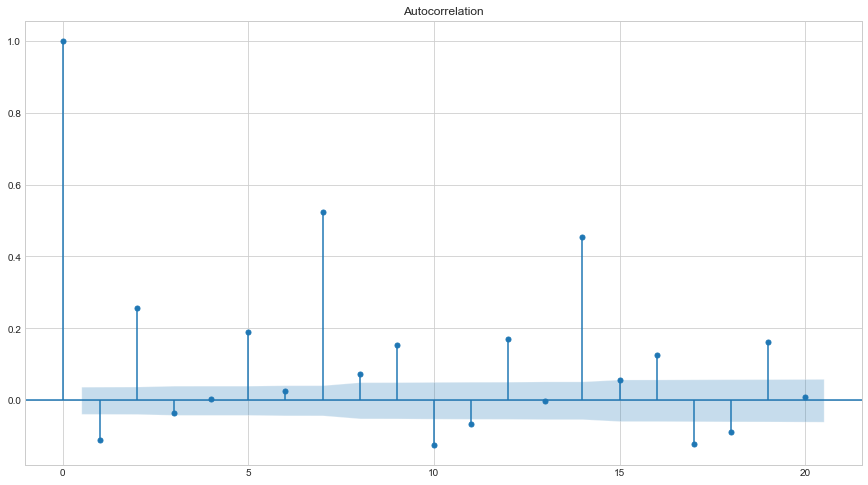

In [389]:
# ACF Plot on Residuals of Our Model
plt.style.use('seaborn-whitegrid')

fig = plt.figure(figsize=(15,18))
ax1 = fig.add_subplot(211)
fig = plot_acf(results_AR.resid, lags=20, ax=ax1);

# Conclusion: Medium autocorrelation, a good sign

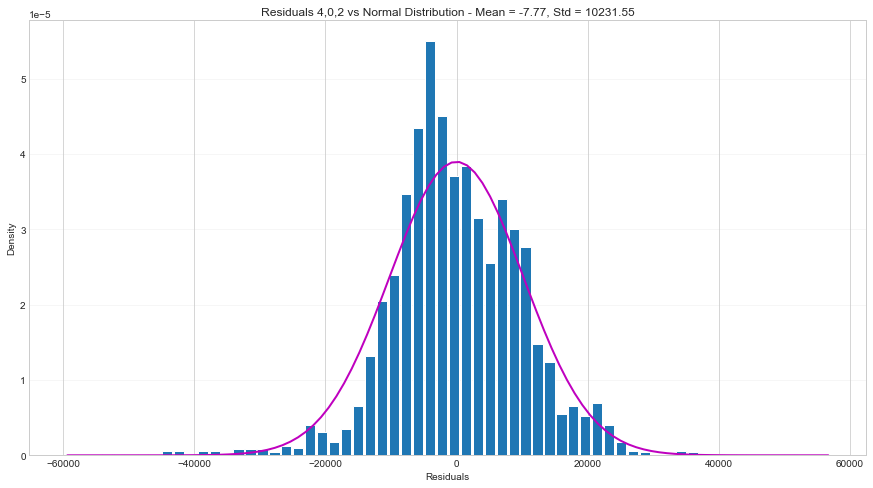

In [392]:
# Histogram on the residuals

plt.figure(figsize = (15, 8))
plt.hist(results_AR.resid, bins = 'auto', density = True, rwidth = 0.85, label = 'Residuals') #density TRUE - norm.dist bell curve
mu, std = norm.fit(results_AR.resid)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100) #linspace returns evenly spaced numbers over a specified interval
p = norm.pdf(x, mu, std) #pdf = probability density function
plt.plot(x, p, 'm', linewidth = 2)
plt.grid(axis='y', alpha = 0.2)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Residuals 4,0,2 vs Normal Distribution - Mean = '+str(round(mu,2))+', Std = '+str(round(std,2)));


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


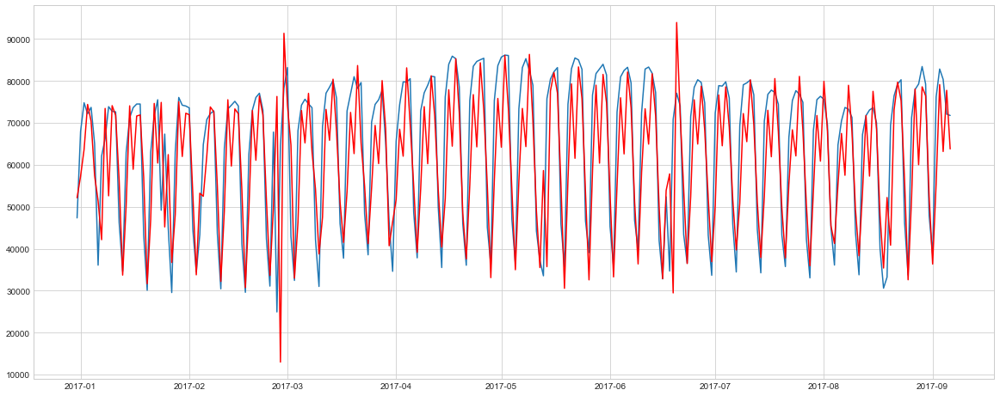

In [401]:
# A CLOSER LOOK
# Using ARIMA for the model, with the argument 'order'

model = ARIMA(df_59_ts, order=(4, 0, 2))  
results_AR = model.fit()
plt.figure(figsize=(20,8))
plt.plot(df_59_ts.tail(250))
plt.plot(results_AR.fittedvalues.tail(250), color='red');

<hr />

## Model Evaluation

In [403]:
# Model Diagnostics - ARIMA 4,0,2

results_AR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2699
Model:                 ARIMA(4, 0, 2)   Log Likelihood              -28755.192
Date:                Sat, 08 Oct 2022   AIC                          57526.384
Time:                        16:11:59   BIC                          57573.589
Sample:                    04-18-2010   HQIC                         57543.455
                         - 09-06-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.743e+04    326.825    175.733      0.000    5.68e+04    5.81e+04
ar.L1          0.5948      0.015     39.534      0.000       0.565       0.624
ar.L2         -1.1050      0.012    -89.007      0.000      -1.129      -1.081
ar.L3          0.7736      0.011     71.593      0.000       0.752       0.795
ar.L4         -0.5657      0.016    -36.264      0.000      -0.596      -0.535
ma.L1          0.3594      0.007     51.664      0.000       0.346       0.373
ma.L2          0.9285      0.006    147.146      0.000       0.916       0.941
sigma2      9.532e+07      0.011   8.92e+09      0.000    9.53e+07    9.53e+07
===================================================================================
Ljung-Box (L1) (Q):                  34.08   Jarque-Bera (JB):               637.92
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.92   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.3e+25. Standard errors may be unstable.
"""

In [404]:
dataset_mean = df_59_ts.mean()
dataset_mean

57433.79659133012

In [405]:
dataset_mae = mean_absolute_error(df_59_ts, results_AR.fittedvalues)
dataset_mae

7780.155768936651

In [406]:
Accuracy = 1 - (dataset_mae / df_59_ts.mean())
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.8645


### Acuracy = 0.8645 or 86,45% fitted on Training Set

<hr />

[Back to top](#topo).

<a class="anchor" id="part_36"></a>
## 8.2.3 ARIMA 2 and ARIMA 4 Forecasts

### ARIMA 2,0,2 Forecast

In [321]:
# For the comparison, let's set up another model
# Arima(2,0,2) model and its fitted values

model202 = ARIMA(df_59_ts, order=(2, 0, 2))  
results_M202 = model202.fit()

In [322]:
# Forecast based on the ARIMA(2,0,2) model

Fcast202 = results_M202.predict(start = '2017-09-07',
                                  end = '2017-12-31')

### ARIMA 4,0,2 Forecast

In [323]:
# ARIMA forecasts
# Setting up an ARIMA(4,0,2) model and storing its fitted values

model_AR4 = ARIMA(df_59_ts, order=(4, 0, 2))  
results_AR4 = model_AR4.fit();

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [324]:
# Forecast based on the ARIMA(4,0,2) model

Fcast402 = results_AR4.predict(start = '2017-09-07',
                                 end = '2017-12-31')

## PREDICTIONS

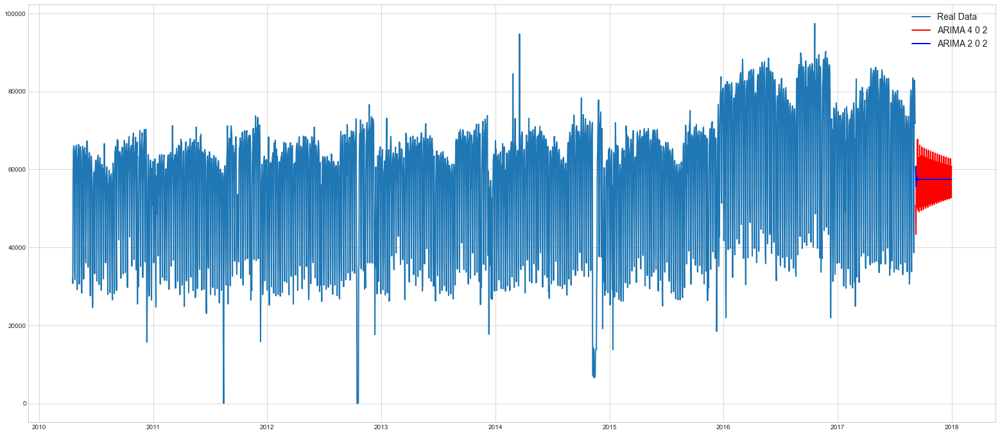

In [420]:
# Comparing the forecasts via data visualization - ARIMA 4 vs ARIMA 2

plt.figure(figsize = (27, 12))

plt.plot(df_59_ts, linewidth = 2, label = "Real Data")
plt.plot(Fcast400, color='red', linewidth = 2,
         label = "ARIMA 4 0 2")
plt.plot(Fcast202, color='blue', linewidth = 2,
         label = "ARIMA 2 0 2")

plt.legend(loc=0, prop={'size': 14});

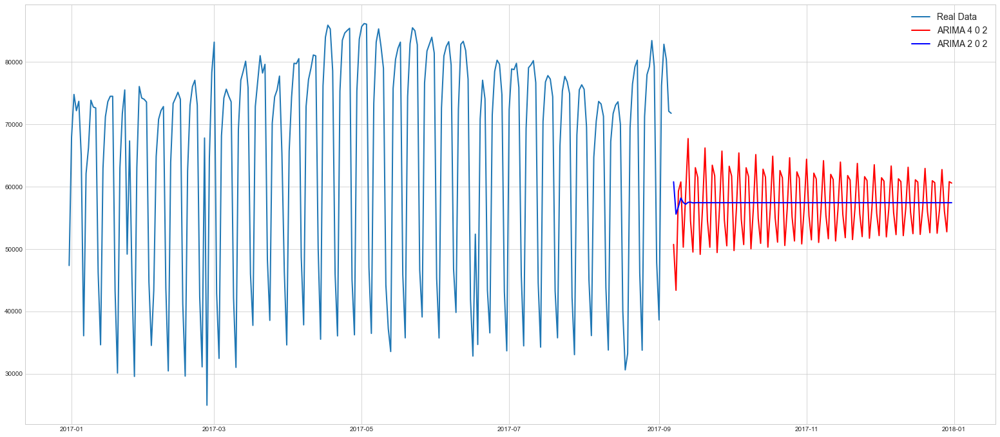

In [419]:
# A CLOSER LOOK
# Comparing the forecasts via data visualization - ARIMA 4 vs ARIMA 2

plt.figure(figsize = (27, 12))

plt.plot(df_59_ts.tail(250), linewidth = 2, label = "Real Data")
plt.plot(Fcast400.tail(250), color='red', linewidth = 2,
         label = "ARIMA 4 0 2")
plt.plot(Fcast202.tail(250), color='blue', linewidth = 2,
         label = "ARIMA 2 0 2")

plt.legend(loc=0, prop={'size': 14});

<hr />

## Conclusion

### - The model ARIMA 4 performed about 4% above ARIMA 2, with respect to Training Set.
### - Based in the Forecasts analysis, it is clear the ARIMA 4 model has the ability to perform way better with unseen data. 

<hr />

[Back to top](#topo).

<hr />

<a class="anchor" id="part_37"></a>
# 9. Bayesian approach - MC3 Monte Carlo Simulations Markov Chains

In [220]:
import pymc3 as pm
import theano.tensor as tt
import altair as alt
from datetime import datetime
from prophet import Prophet
from abc import ABC, abstractmethod

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


### In order to facilitate the development of this test, instead of coding a bayesian time series and/or regression by hand as usual, we will apply the well-known Facebook Prophet PyMC3 library. A library for time series analysis that is available to us as an open-source. It consists in a bayesian time series analyis with generalized additive and multiplicative models. 
### We will be applying Bayesian modeling to infer various seasonal patterns combined with unpredictable changepoints and wrap them in a generalized additive model.
    
### The overall handicap of its forecast accuracy is 94.57%, satisfatorily high. 
<br />

### Bayesian networks
* Soft dependencies between 2 consecutive values, where state 1 is related to state 2. Readings over time are related to each other, that's why you have kind of a series dependence. So you can model state estimation. Markov Chain is a chain where the next element depends on the state of the previous one. Monte Carlo simulates samples/draws from the target distribution -> simulates Markov Chains. *


<hr />

<a class="anchor" id="part_38"></a>
## 9.1 59 ST year 2017

In [ ]:
df_59_2017_date.to_csv('df_mc3.csv')
df_mc3 = pd.read_csv('df_mc3.csv')

In [497]:
df_mc3['ds'] = pd.to_datetime(df_mc3['date'])
df_mc3['y'] = df_mc3['DAILY_ENTRIES']

In [498]:
df_mc3 = df_mc3[['ds', 'y']]
df_mc3

,ds,y
0,2017-01-01,44912.0
1,2017-01-02,31288.0
2,2017-01-03,35690.0
3,2017-01-04,66137.0
4,2017-01-05,75734.0
5,2017-01-06,75484.0
6,2017-01-07,75391.0
7,2017-01-08,45325.0
8,2017-01-09,33105.0
9,2017-01-10,65712.0


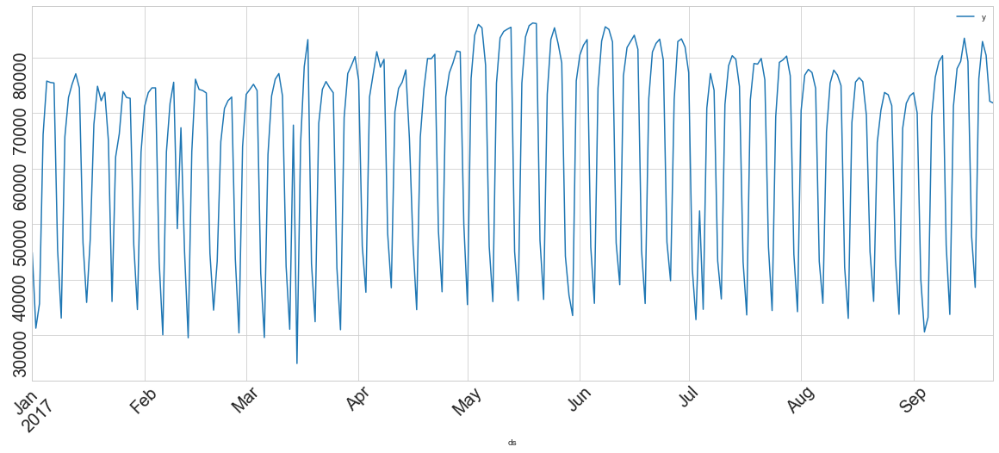

In [502]:
df_mc3.plot(x='ds', y='y', figsize=(20,8))
plt.xticks(fontsize=20, rotation=45)
plt.yticks(fontsize=20, rotation=90);

In [503]:
model = Prophet(seasonality_mode = 'additive', daily_seasonality=True, uncertainty_samples = 100, mcmc_samples=100, interval_width = 0.95) 
#model.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=0.1)
control = {}
#control['max_treedepth'] = 18
#control['adapt_delta'] = 0.99

In [564]:
model.fit(df_mc3, control = control)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS

In [565]:
future_entries = model.make_future_dataframe(periods=99)  # PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS - placeholder da janela de datas

## FORECAST

In [566]:
forecast = model.predict(future_entries) # FORECAST: cálculo da predição dos dias determinados no período

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [519]:
model.predictive_samples(future_entries)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


{'yhat': array([[48034.24636068, 28545.84683612, 30645.21632462, ...,
         34590.21185802, 43877.02263719, 55956.30220259],
        [25608.42669212, 29220.6339516 , 28718.9795478 , ...,
         29048.77252616, 39042.97777839, 30151.69956718],
        [53280.24992098, 63042.39593274, 56561.42216423, ...,
         68426.62968074, 51506.17939609, 62246.0097619 ],
        ...,
        [95826.27249635, 83368.29432656, 78146.61234755, ...,
         84334.76393537, 84455.57812698, 82293.37230539],
        [75826.87498541, 80142.20043648, 79830.04983478, ...,
         87318.48533817, 76384.37343904, 88774.95830177],
        [51510.94338378, 51640.72411625, 30497.65655452, ...,
         41222.1657795 , 41772.94876655, 54668.88327278]]),
 'trend': array([[ 166938.92852088, -106711.30462144,  166979.34501279, ...,
         -193382.92684503,  371607.76317784,  109895.26395014],
        [ 167005.59618981, -106657.74969652,  167060.67009439, ...,
         -193279.8713736 ,  371751.26718754,  10

In [532]:
forecast[[ 'ds',  'yhat' ]]

,ds,yhat
0,2017-01-01,40788.695009
1,2017-01-02,29884.537593
2,2017-01-03,60468.718385
3,2017-01-04,68848.722834
4,2017-01-05,73386.221879
5,2017-01-06,73258.673798
6,2017-01-07,71953.970605
7,2017-01-08,41049.534641
8,2017-01-09,30145.377227
9,2017-01-10,60728.916559


(17148.8, 17549.2)

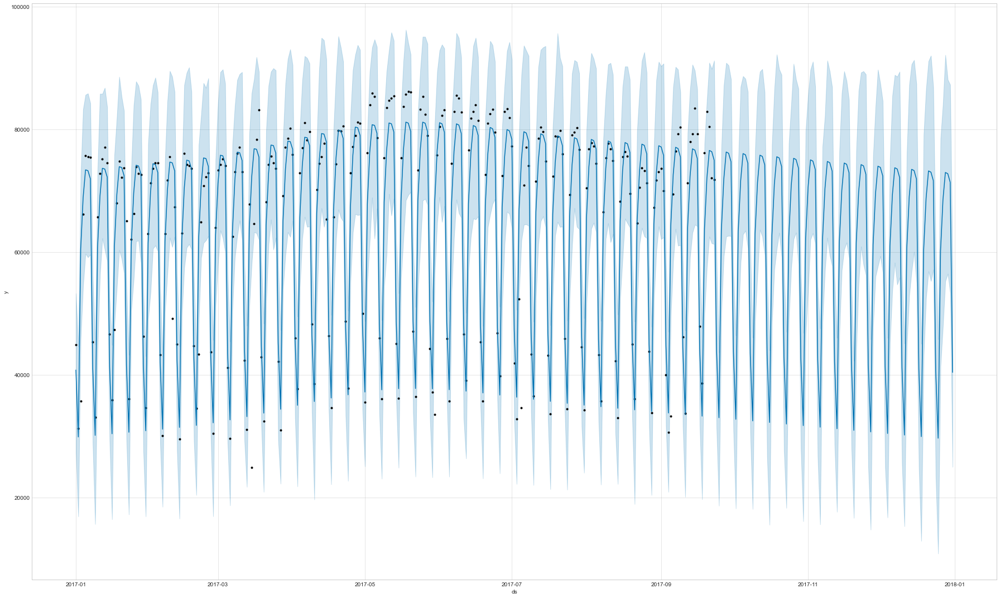

In [523]:
# Plotting the model
# Black dots: real data
# Blue line: fit line (model)
# Light blue band: confidence interval of 0.95

model.plot(forecast, figsize=(25,15))
plt.xlim();

In [562]:
# Python
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast, figsize=(1800,1000), xlabel='Date', ylabel='Daily Entries', trend=True, changepoints=True, changepoints_threshold=0.01)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


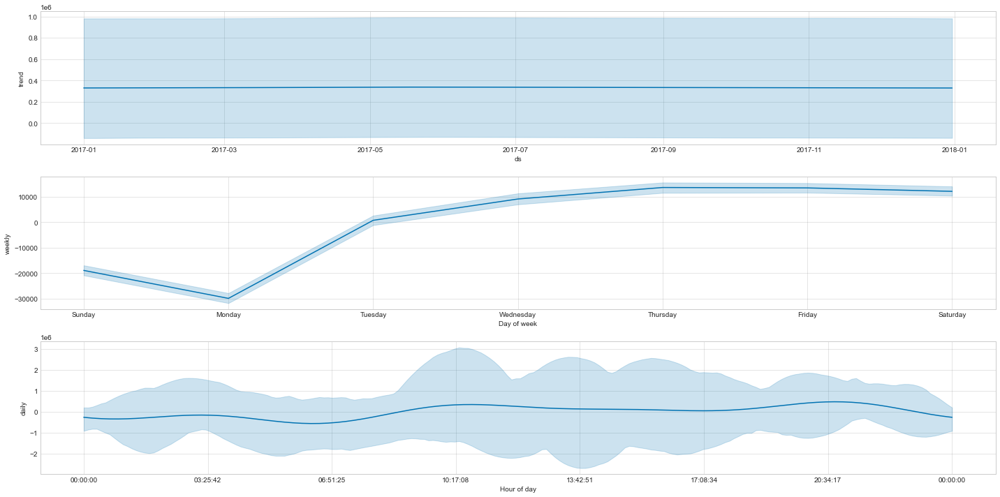

In [561]:
plt.style.use('seaborn-whitegrid')

model.plot_components(forecast, figsize=(20,10));

<hr />

## Model Evaluation

In [558]:
# Function Mean Absolute Error

def MAE(y, y_pred):
    y = df_mc3['y'].to_numpy()
    y_pred = forecast['yhat'].to_numpy()

    AE = np.zeros(len(y))
    for i in range(len(y)):
        AE[i] = (abs(y[i] - y_pred[i]))
    MAE = AE.mean()
    return round(MAE,4)

In [535]:
dataset_mean = df_mc3['y'].mean()
dataset_mean

64331.46240601504

In [559]:
dataset_mae = MAE(df_mc3['y'], forecast['yhat'])
dataset_mae

3820.8055

In [560]:
Accuracy = 1 - (dataset_mae / dataset_mean)
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.9406


## Acuracy = 0.9406 or 94,06% fitted on Training Set

<hr />

[Back to top](#topo).

# Validation Set
# For a 60-day prediction on 59 ST 2017 data (rolling back the clock in 1 months)

In [619]:
df_59_2017_date.to_csv('df_mc3.csv')
df_mc3 = pd.read_csv('df_mc3.csv')

In [620]:
df_mc3['ds'] = pd.to_datetime(df_mc3['date'])
df_mc3['y'] = df_mc3['DAILY_ENTRIES']

In [638]:
df_mc3 = df_mc3[['ds', 'y']]
df_mc3[:-60]

,ds,y
0,2017-01-01,44912.0
1,2017-01-02,31288.0
2,2017-01-03,35690.0
3,2017-01-04,66137.0
4,2017-01-05,75734.0
5,2017-01-06,75484.0
6,2017-01-07,75391.0
7,2017-01-08,45325.0
8,2017-01-09,33105.0
9,2017-01-10,65712.0


In [639]:
model = Prophet(seasonality_mode = 'additive', daily_seasonality=True, uncertainty_samples = 100, mcmc_samples=100, interval_width = 0.95) 
#model.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=0.1)
control = {}
#control['max_treedepth'] = 18
#control['adapt_delta'] = 0.99

In [641]:
model.fit(df_mc3[:-60], control = control)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS

In [642]:
future_entries = model.make_future_dataframe(periods=60)  # PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS - placeholder da janela de datas

## FORECAST

In [643]:
forecast = model.predict(future_entries) # FORECAST: cálculo da predição dos dias determinados no período

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [644]:
forecast[[ 'ds',  'yhat' ]]

,ds,yhat
0,2017-01-01,41332.049238
1,2017-01-02,30169.636503
2,2017-01-03,60560.899968
3,2017-01-04,68349.515636
4,2017-01-05,73519.712557
5,2017-01-06,73433.739977
6,2017-01-07,72417.526075
7,2017-01-08,41480.603845
8,2017-01-09,30319.668525
9,2017-01-10,60712.409399


In [646]:
# Plotting the model
# Black dots: real data
# Blue line: fit line (model)
# Light blue band: confidence interval of 0.95

from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast, figsize=(1800,1000), xlabel='Date', ylabel='Daily Entries', trend=True, changepoints=True, changepoints_threshold=0.01)

<hr />

<hr />

## Model Evaluation

In [647]:
# Function Mean Absolute Error

def MAE(y, y_pred):
    y = df_mc3['y'].to_numpy()
    y_pred = forecast['yhat'].to_numpy()

    AE = np.zeros(len(y))
    for i in range(len(y)):
        AE[i] = (abs(y[i] - y_pred[i]))
    MAE = AE.mean()
    return round(MAE,4)

In [648]:
dataset_mean = df_mc3['y'].mean()
dataset_mean

64331.46240601504

In [649]:
dataset_mae = MAE(df_mc3['y'], forecast['yhat'])
dataset_mae

3855.2126

In [650]:
Accuracy = 1 - (dataset_mae / dataset_mean)
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.9401


## Acuracy = 0.9401 or 94,01% on Validation Set

[Back to top](#topo).

<hr />

<a class="anchor" id="part_39"></a>
## 9.2 59 ST years 2010-2017

In [215]:
df_59_date.to_csv('df_mc3.csv')
df_mc3 = pd.read_csv('df_mc3.csv')

In [216]:
df_mc3['ds'] = pd.to_datetime(df_mc3['date'])
df_mc3['y'] = df_mc3['DAILY_ENTRIES']

In [217]:
df_mc3 = df_mc3[['ds', 'y']]
df_mc3.shape

(2693, 2)

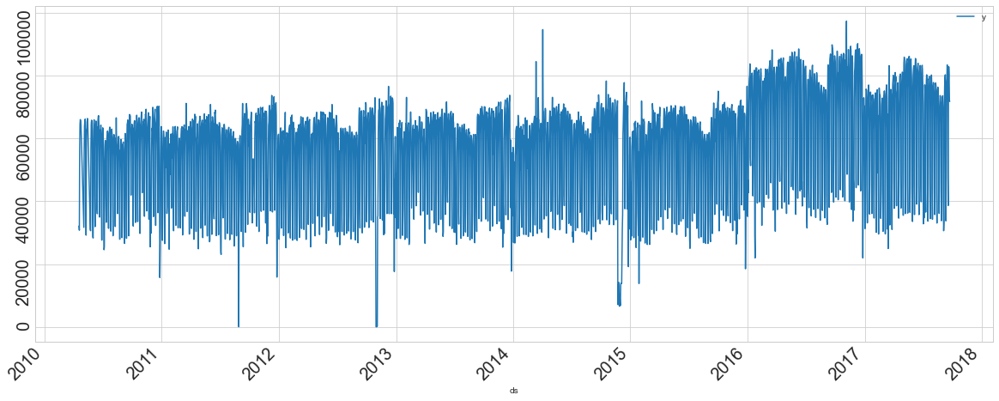

In [582]:
df_mc3.plot(x='ds', y='y', figsize=(20,8))
plt.xticks(fontsize=20, rotation=45)
plt.yticks(fontsize=20, rotation=90);

In [225]:
model = Prophet(seasonality_mode = 'additive', daily_seasonality=True, uncertainty_samples = 100, mcmc_samples=100, interval_width = 0.95) 
#model.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=0.1)
control = {}
#control['max_treedepth'] = 18
#control['adapt_delta'] = 0.99

In [226]:
model.fit(df_mc3, control = control)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
To run all diagnostics call pystan.check_hmc_diagnostics(fit)


## PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS

In [227]:
future_entries = model.make_future_dataframe(periods=99)  # PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS - placeholder da janela de datas

## FORECAST

In [228]:
forecast = model.predict(future_entries) # FORECAST: cálculo da predição dos dias determinados no período

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


In [229]:
model.predictive_samples(future_entries)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


{'yhat': array([[31442.69300357, 27576.86143801, 31070.92899067, ...,
         34365.70634541, 32584.65514015, 31984.82355573],
        [24164.68833229, 30123.52534845, 26860.60028935, ...,
         24792.33447081, 17255.90897611, 22648.3234385 ],
        [60938.08976589, 51340.04824228, 53037.32125422, ...,
         67145.69280898, 61846.09944501, 60639.1599455 ],
        ...,
        [71410.22690009, 76598.21458662, 71507.25561959, ...,
         77445.29952856, 76627.06800608, 67810.60503237],
        [64757.17567531, 62762.42060357, 60294.59016668, ...,
         74715.18687744, 59426.14661469, 64759.85531249],
        [50372.6179676 , 49738.68473488, 49884.70618218, ...,
         51011.74815157, 24536.78290186, 30375.60643255]]),
 'trend': array([[201928.92119188, 298634.23276013, 292297.44238499, ...,
         224279.83292161, 178893.77024196,  70545.28094814],
        [201930.65158469, 298635.64779691, 292299.51218411, ...,
         224278.17662723, 178900.16988039,  70553.2777503

In [ ]:
# Plotting the model
# Black dots: real data
# Blue line: fit line (model)
# Light blue band: confidence interval of 0.95

from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast, figsize=(1800,1000), xlabel='Date', ylabel='Daily Entries', trend=True, changepoints=True, changepoints_threshold=0.01)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



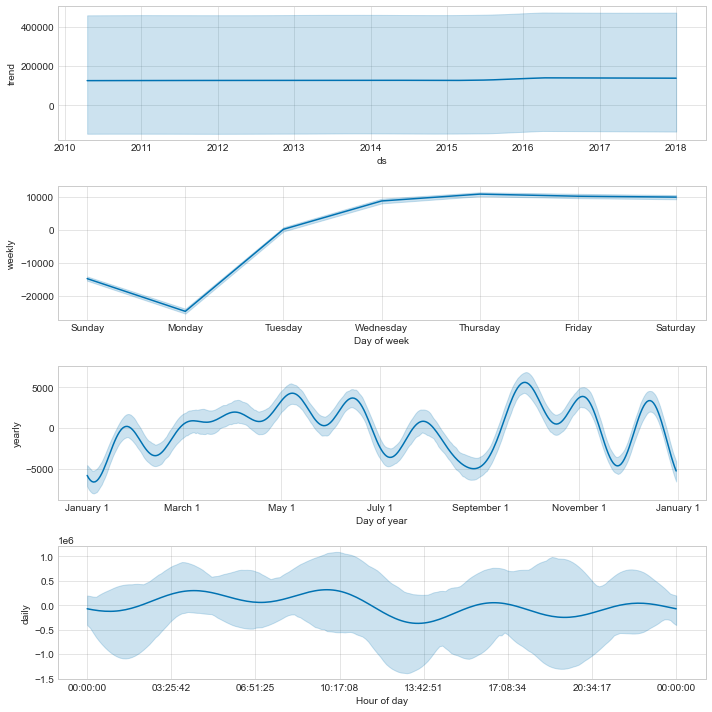

In [598]:
plt.style.use('seaborn-whitegrid')

model.plot_components(forecast, figsize=(10,10));

<hr />

## Model Evaluation

In [232]:
# Function Mean Absolute Error

def MAE(y, y_pred):
    y = df_mc3['y'].to_numpy()
    y_pred = forecast['yhat'].to_numpy()

    AE = np.zeros(len(y))
    for i in range(len(y)):
        AE[i] = (abs(y[i] - y_pred[i]))
    MAE = AE.mean()
    return round(MAE,4)

In [233]:
dataset_mean = df_mc3['y'].mean()
dataset_mean

57561.587820274784

In [234]:
dataset_mae = MAE(df_mc3['y'], forecast['yhat'])
dataset_mae

4274.0498

In [235]:
Accuracy = 1 - (dataset_mae / dataset_mean)
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.9257


## Acuracy = 0.9257 or 92,57% fitted on Training Set

<hr />

[Back to top](#topo).

<hr />

# Validation Set
# For a 1-year prediction on 59 ST 2010-2017 data (rolling back the clock in 1 year)

In [236]:
df_59_date.to_csv('df_mc3.csv')
df_mc3 = pd.read_csv('df_mc3.csv')

In [237]:
df_mc3['ds'] = pd.to_datetime(df_mc3['date'])
df_mc3['y'] = df_mc3['DAILY_ENTRIES']

In [238]:
df_mc3 = df_mc3[['ds', 'y']]

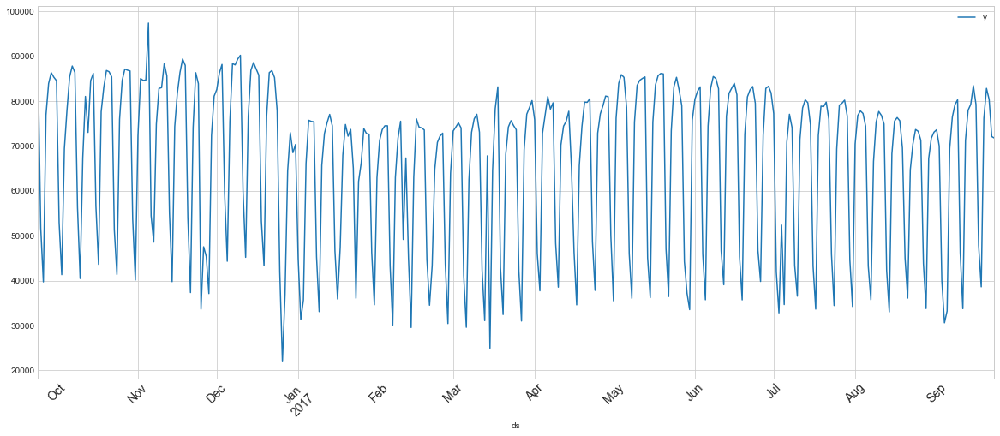

In [681]:
df_mc3[-365:].plot(x='ds', y='y', figsize=(20,8))
plt.xticks(fontsize=14, rotation=45);

In [239]:
model = Prophet(seasonality_mode = 'additive', daily_seasonality=True, uncertainty_samples = 100, mcmc_samples=100, interval_width = 0.95) 
#model.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=0.1)
control = {}
#control['max_treedepth'] = 18
#control['adapt_delta'] = 0.99

In [240]:
model.fit(df_mc3[:-365], control = control)

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


## PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS

In [241]:
future_entries = model.make_future_dataframe(periods=365)  # PLACEHOLDER TO HOLD OUR FEATURE PREDICTIONS - placeholder da janela de datas

## FORECAST

In [242]:
forecast = model.predict(future_entries) # FORECAST: cálculo da predição dos dias determinados no período

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\marce\anaconda3\lib\site-packages\prophet\forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



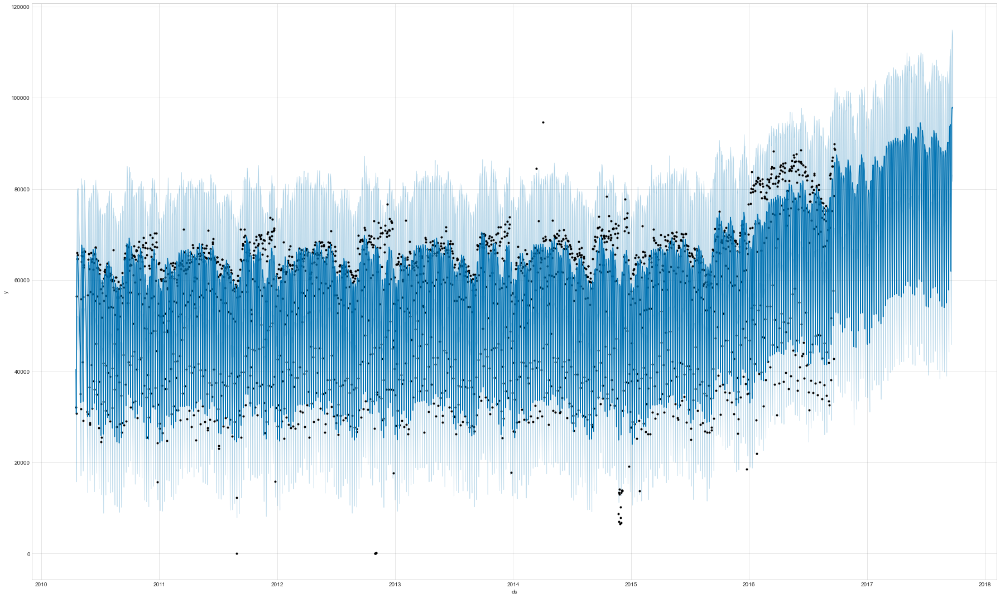

In [676]:
# Plotting the model
# Black dots: real data
# Blue line: fit line (model)
# Light blue band: confidence interval of 0.95

model.plot(forecast, figsize=(25,15))
plt.xlim();

In [ ]:
# Plotting the model
# Black dots: real data
# Blue line: fit line (model)
# Light blue band: confidence interval of 0.95

from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast, figsize=(1600,800), xlabel='Date', ylabel='Daily Entries', trend=True, changepoints=True, changepoints_threshold=0.01)

<hr />

## Model Evaluation

In [661]:
# Function Mean Absolute Error

def MAE(y, y_pred):
    y = df_mc3['y'].to_numpy()
    y_pred = forecast['yhat'].to_numpy()

    AE = np.zeros(len(y))
    for i in range(len(y)):
        AE[i] = (abs(y[i] - y_pred[i]))
    MAE = AE.mean()
    return round(MAE,4)

In [662]:
dataset_mean = df_mc3['y'].mean()
dataset_mean

57433.79659133012

In [663]:
dataset_mae = MAE(df_mc3['y'], forecast['yhat'])
dataset_mae

5440.1906

In [664]:
Accuracy = 1 - (dataset_mae / dataset_mean)
print(f"Acuracy = {Accuracy:.4f}")

Acuracy = 0.9053


## Acuracy = 0.9053 or 90,53% on Validation Set

<hr />

[Back to top](#topo).

<hr />

# Conclusion
# Experiment Comparison - ARIMA 4, ARIMA 2 and MC3 (Prophet) Time Series models

## The best evaluation so far was reaached by the Bayesian PyMC3 model.

### - Accuracy on Validation Set reached 0.9401 or 94,01% for 1 year predictions dataset,  on a 60-day prediction window within the Validation Set 
### - Accuracy on Validation Set reached 0.9053 or 90,53% for the complete historical data prediction,  on a 1-year prediction window within the Validation Set
### - ARIMA 4,0,2 has beaten ARIMA 2,0,2 reaching 0.8788 or 87,88% for 1 year predictions fitted on Training Set and 0.8645 or 86,45% prediction over the complete historical data.



<hr />

<hr />

<hr />

[Back to top](#topo).